In [1]:
import importlib.util
import sys
from pathlib import Path
custom_rqa_path = Path("/home/idies/workspace/RQA-and-mrDMD") / "CustomRQA.py"

spec = importlib.util.spec_from_file_location("CustomRQA", str(custom_rqa_path))

CustomRQA = importlib.util.module_from_spec(spec)

spec.loader.exec_module(CustomRQA)

sys.modules["CustomRQA"] = CustomRQA



truncate_path = Path("/home/idies/workspace/RQA-and-mrDMD") / "truncate.py"

spec = importlib.util.spec_from_file_location("truncate", str(truncate_path))

truncate = importlib.util.module_from_spec(spec)

spec.loader.exec_module(truncate)

sys.modules["truncate"] = truncate

Note: you may need to restart the kernel to use updated packages.


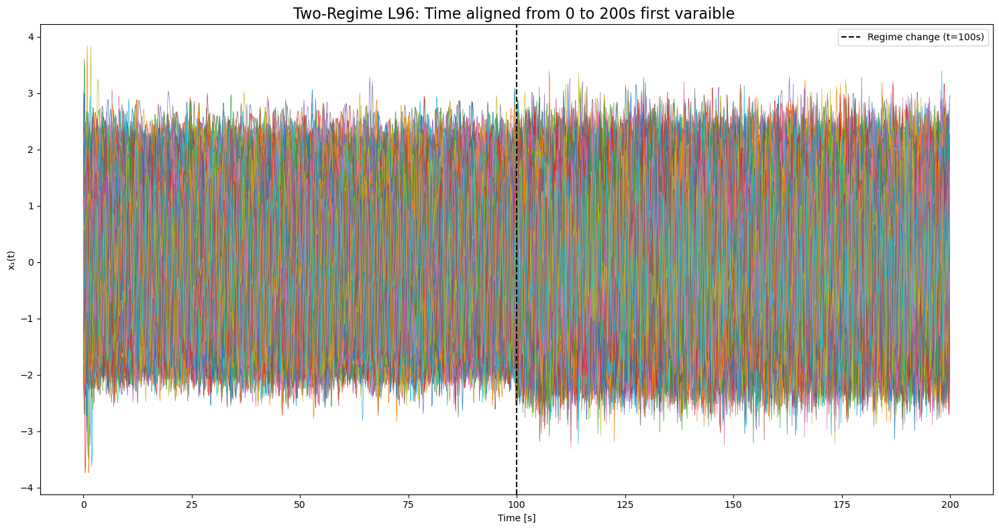

(540, 2000)


In [2]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from scipy.integrate import odeint
%pip install pydmd
from pydmd import DMD, BOPDMD, MrDMD
from pydmd.plotter import plot_eigs, plot_summary
from pydmd.preprocessing import hankel_preprocessing
import warnings
from sklearn.preprocessing import StandardScaler
import CustomRQA as rqa
import truncate as tr
warnings.filterwarnings('ignore')

def l96(x,t, F, alpha=1):
  return (np.roll(x, -1) - np.roll(x, 2)) * np.roll(x, 1) - alpha* x + F
total_time = 120
m = 1200
dt = total_time/m
t1 = np.arange(0.0,total_time, dt)
n=540
F_1 = 5
x0 = F_1 * np.ones(n)
x0[0] += 0.01
alpha1=1
regime1 = odeint(l96, x0, t1, args=(F_1, alpha1))
regime1 = regime1[200:]
t1 = t1[200:]
total_time = 200
m = 2000
dt = total_time/m
t2 = np.arange(0.0,total_time, dt)
F_2 = 16
x0 = F_2 * np.ones(n)
x0[0] += 0.01
alpha2= 1.5
regime2 = odeint(l96, x0, t2, args=(F_2, alpha2))
regime2 = regime2[1000:]
t2 = t2[1000:]
t1_adj = (t1 - 20)     
t2_adj = t2     

t = np.concatenate([t1_adj, t2_adj])              
x = np.vstack([regime1, regime2])              
X = x.T
X = StandardScaler().fit_transform(X)
plt.figure(figsize=(15,8))
for i in range(540):
    plt.plot(t, X[i], lw=0.5)
plt.axvline(100, color='k', linestyle='--', label='Regime change (t=100s)')
plt.xlabel('Time [s]')
plt.ylabel('x₁(t)')
plt.title('Two‐Regime L96: Time aligned from 0 to 200s first varaible ', fontsize=16)
plt.legend()
plt.tight_layout()
plt.show()
print(X.shape)

In [3]:
print(X.shape)
sub_dmd = DMD(svd_rank=0.75)
l=8
mrdmd = MrDMD(sub_dmd, max_level=l, max_cycles=1)
mrdmd.fit(X)

(540, 2000)


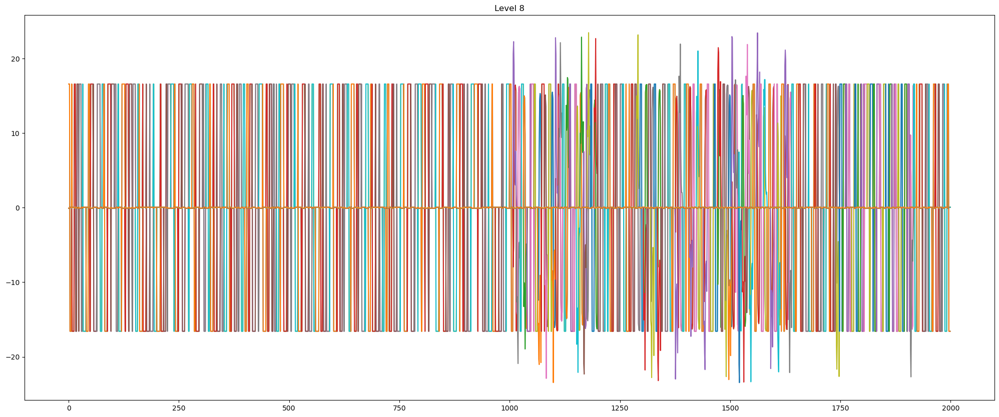

(552, 2000)
(2000, 296)


In [4]:
last_dynamics = mrdmd.partial_dynamics(level=l)
last_dynamics = StandardScaler().fit_transform(last_dynamics.real)
plt.figure(figsize=(25,10))
for i in range(last_dynamics.shape[0]):
    plt.plot(last_dynamics[i])
plt.title(f'Level 8')
plt.show()
print(last_dynamics.shape)
df_dynamics = tr.correlation_truncate(last_dynamics.T, threshold =0.80)
all_vectors_new = df_dynamics.to_numpy()
all_vectors = all_vectors_new
print(all_vectors_new.shape)


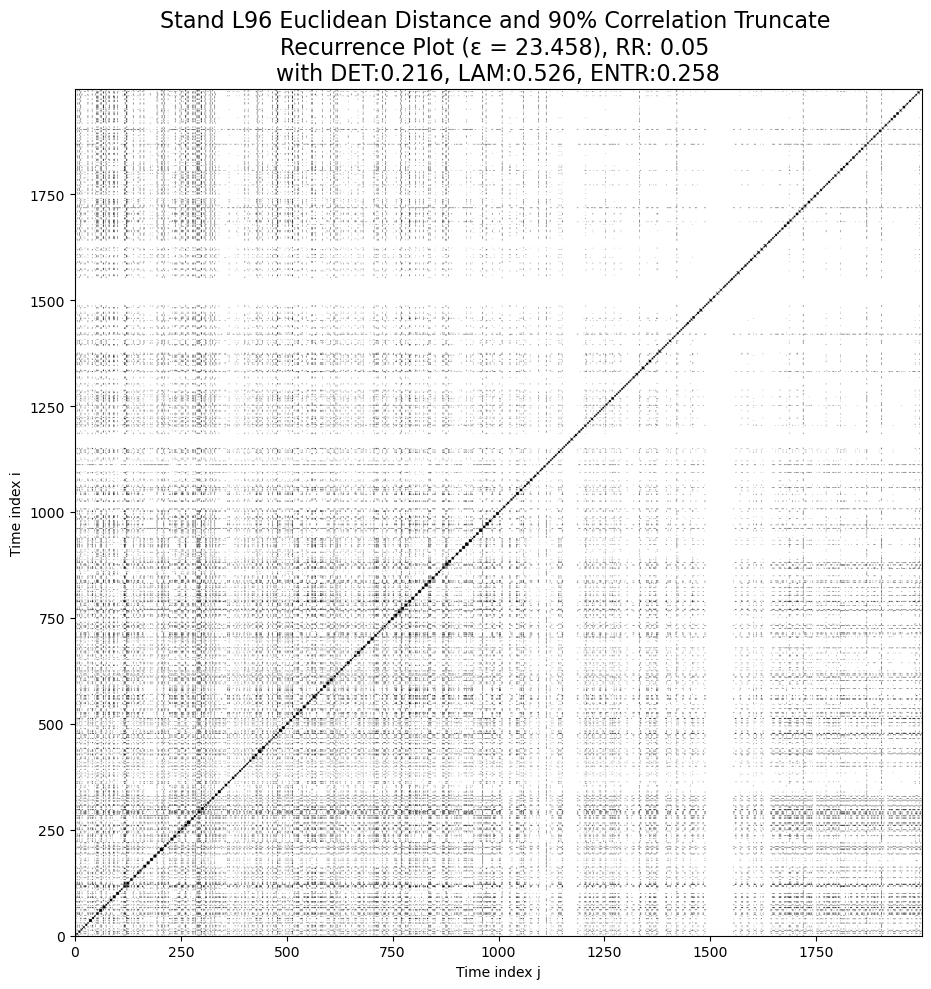

In [5]:
all_vectors = all_vectors_new
p=5
metrics = rqa.RecurrencePlot(all_vectors, percent=p, metric ='euclidean', plot = True, globalEpsilon=True, Title = 'Stand L96 Euclidean Distance and 90% Correlation Truncate',lines = False)

In [6]:
'''
from tqdm import tqdm
import time
times, det_ts, lam_ts, entr_ts = [], [], [], []
sub_dmd = DMD(svd_rank=0.75)
l=6
mrdmd = MrDMD(sub_dmd, max_level=l, max_cycles=1)

for t in tqdm(range(int(one_side), int(total_time - one_side), 1)):
    time.sleep(0.1)
    block_X = X[:, int(t - one_side) : int(t + one_side) ]
    mrdmd.fit(block_X)
    last_dynamics = mrdmd.partial_dynamics(level=l)
    last_dynamics = StandardScaler().fit_transform(last_dynamics.real)
    # 
    df_dynamics = tr.correlation_truncate(last_dynamics.T, threshold =0.80)
    all_vectors_new = df_dynamics.to_numpy()
    metrics,_ = rqa.RecurrencePlot(all_vectors_new, percent=p, globalEpsilon=True, plot=False)
    det_ts.append(metrics['DET'])
    lam_ts.append(metrics['LAM'])
    entr_ts.append(metrics['ENTR'])  
    times.append(t)
times = np.array(times)
DETS = det_ts
LAMS= lam_ts
ENTRS = entr_ts

print(times)
'''

total_time = X.shape[1]
window_size= .1 * total_time
one_side = window_size//2

times = np.load('/home/idies/workspace/RQA-and-mrDMD/Lorenz96/final_times.npy')

DETS = np.load('/home/idies/workspace/RQA-and-mrDMD/Lorenz96/final_DETS.npy')
LAMS = np.load('/home/idies/workspace/RQA-and-mrDMD/Lorenz96/final_LAMS.npy')
ENTRS = np.load('/home/idies/workspace/RQA-and-mrDMD/Lorenz96/final_ENTRS.npy')


In [7]:
'''
np.save('final_times.npy', times)
np.save('final_ENTRS.npy', ENTRS)
np.save('final_LAMST.npy', LAMS)
np.save('final_DETS.npy', DETS)
'''

"\nnp.save('final_times.npy', times)\nnp.save('final_ENTRS.npy', ENTRS)\nnp.save('final_LAMST.npy', LAMS)\nnp.save('final_DETS.npy', DETS)\n"

(540, 2000)
[0.000e+00 1.000e-01 2.000e-01 ... 1.997e+02 1.998e+02 1.999e+02]
[ 10.   10.1  10.2 ... 189.7 189.8 189.9]
[100.]
20.0


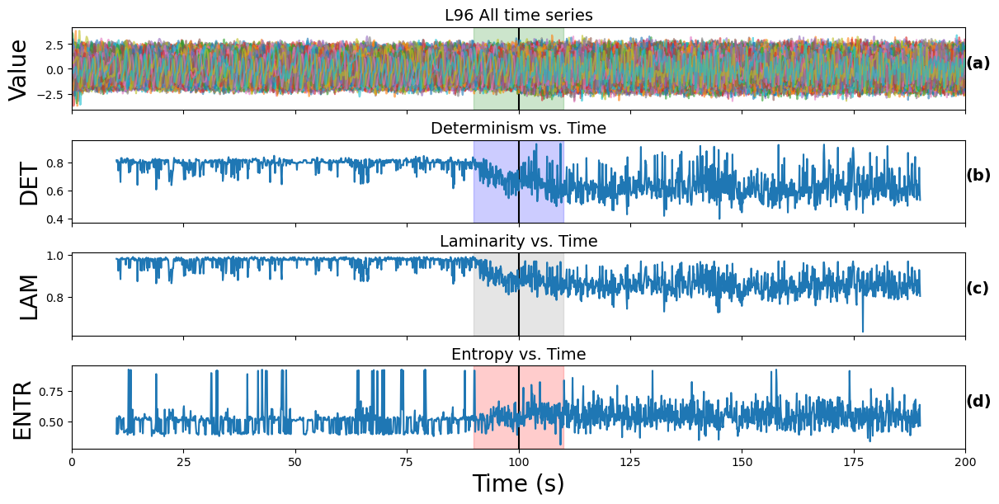

In [8]:
x=X
total_time = 200
real_times = times * 0.1
print(X.shape)
time_axis = np.arange(X.shape[1]) * 0.1
print(time_axis)
print(real_times)


regime_times_real = np.array([100.0])
window_real = window_size * (total_time / (x.shape[1]))
print(regime_times_real)
print(window_real)


fig, axes = plt.subplots(4, 1, sharex=True, figsize=(12, 6), constrained_layout=True)

labels = ['(a)', '(b)', '(c)', '(d)']
regime_kwargs = dict(color='black', linestyle='solid')
i = 0 
colors = ['green', 'blue', 'gray', 'red', 'yellow']
for ax in axes:
    for t_real in regime_times_real:
        ax.axvline(t_real, **regime_kwargs)
        ax.axvspan(t_real - window_real/2, t_real + window_real/2, color=colors[i], alpha=0.2)
        i = (i+1)%5


for row in X:
    axes[0].plot(time_axis, row, alpha=0.6)
axes[0].set_ylabel('Value', fontsize=20)
axes[0].set_title('L96 All time series', fontsize=14)


axes[1].plot(real_times, DETS)
axes[1].set_ylabel('DET', fontsize=20)
axes[1].set_title('Determinism vs. Time', fontsize=14)

axes[2].plot(real_times, LAMS)
axes[2].set_ylabel('LAM', fontsize=20)
axes[2].set_title('Laminarity vs. Time', fontsize=14)

axes[3].plot(real_times, ENTRS)
axes[3].set_ylabel('ENTR', fontsize=20)
axes[3].set_title('Entropy vs. Time', fontsize=14)
axes[3].set_xlabel('Time (s)', fontsize=20)
axes[3].set_xlim(0, total_time)

for ax, label in zip(axes, labels):
    ax.text(1, 0.51, label, transform=ax.transAxes,
            fontsize=14, fontweight='bold')

plt.show()

In [9]:
from scipy.signal import savgol_filter
DETS = savgol_filter(DETS, int(window_size//2), 2)
ENTRS = savgol_filter(ENTRS, int(window_size//2),2)
LAMS = savgol_filter(LAMS, int(window_size//2), 2)

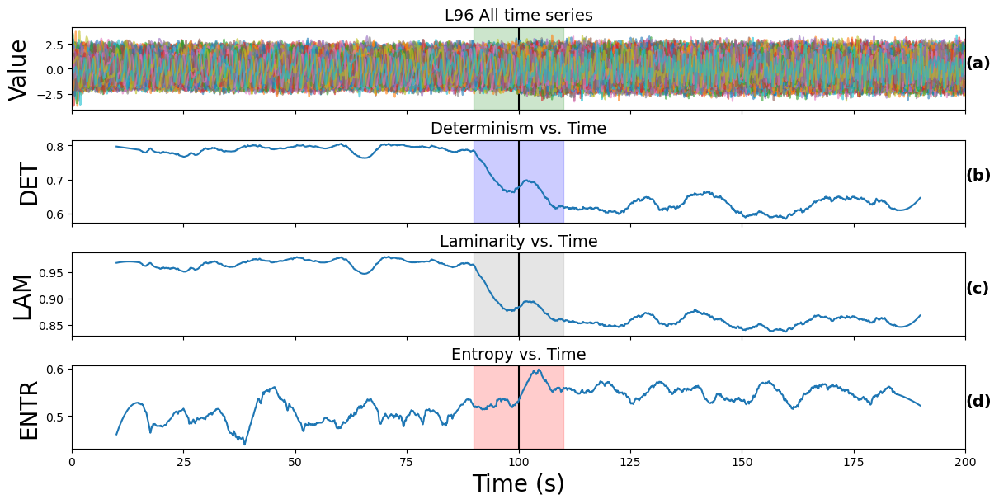

In [10]:
x=X
total_time = 200
real_times = times * 0.1
time_axis = np.arange(X.shape[1]) * 0.1



regime_times_real = np.array([100.0])
window_real = window_size * (total_time / (x.shape[1]))



fig, axes = plt.subplots(4, 1, sharex=True, figsize=(12, 6), constrained_layout=True)

labels = ['(a)', '(b)', '(c)', '(d)']
regime_kwargs = dict(color='black', linestyle='solid')
i = 0 
colors = ['green', 'blue', 'gray', 'red', 'yellow']
for ax in axes:
    for t_real in regime_times_real:
        ax.axvline(t_real, **regime_kwargs)
        ax.axvspan(t_real - window_real/2, t_real + window_real/2, color=colors[i], alpha=0.2)
        i = (i+1)%5


for row in X:
    axes[0].plot(time_axis, row, alpha=0.6)
axes[0].set_ylabel('Value', fontsize=20)
axes[0].set_title('L96 All time series', fontsize=14)


axes[1].plot(real_times, DETS)
axes[1].set_ylabel('DET', fontsize=20)
axes[1].set_title('Determinism vs. Time', fontsize=14)

axes[2].plot(real_times, LAMS)
axes[2].set_ylabel('LAM', fontsize=20)
axes[2].set_title('Laminarity vs. Time', fontsize=14)

axes[3].plot(real_times, ENTRS)
axes[3].set_ylabel('ENTR', fontsize=20)
axes[3].set_title('Entropy vs. Time', fontsize=14)
axes[3].set_xlabel('Time (s)', fontsize=20)
axes[3].set_xlim(0, total_time)

for ax, label in zip(axes, labels):
    ax.text(1, 0.51, label, transform=ax.transAxes,
            fontsize=14, fontweight='bold')

plt.show()

In [11]:
times = np.load('/home/idies/workspace/RQA-and-mrDMD/Lorenz96/final_times.npy')

REAL_DETS = np.load('/home/idies/workspace/RQA-and-mrDMD/Lorenz96/final_DETS.npy')
REAL_LAMS = np.load('/home/idies/workspace/RQA-and-mrDMD/Lorenz96/final_LAMS.npy')
REAL_ENTRS = np.load('/home/idies/workspace/RQA-and-mrDMD/Lorenz96/final_ENTRS.npy')


In [12]:
import random

def get_metrics(DETS,LAMS,ENTRS,n):
    sampled_dets = []
    sampled_lams = []
    sampled_entr = []
    sampled_ratio = []
    N = DETS.shape[0] - 1
    for i in range(0,n):
        random_number = random.randint(0, N)
        det = DETS[random_number]
        lam = LAMS[random_number]
        entr = ENTRS[random_number]
        '''
                block = x[int(random_number-window_size//2): int(random_number+window_size//2)]
        metrics,_ = rqa.RecurrencePlot(block, percent=p, metric ='euclidean', globalEpsilon=True)
        det = metrics['DET']
        lam = metrics['LAM']
        entr = metrics['ENTR']
        '''
        sampled_dets.append(det)
        sampled_lams.append(lam)
        sampled_entr.append(entr)
    return sampled_dets, sampled_lams, sampled_entr
sampled_dets, sampled_lams, sampled_entr = get_metrics(DETS,LAMS,ENTRS,10000)

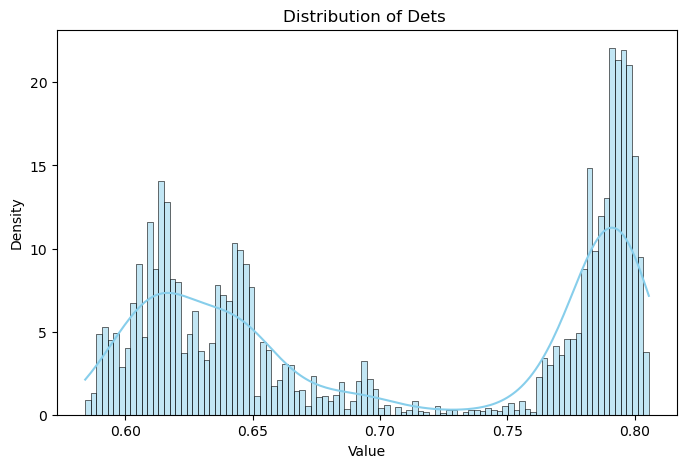

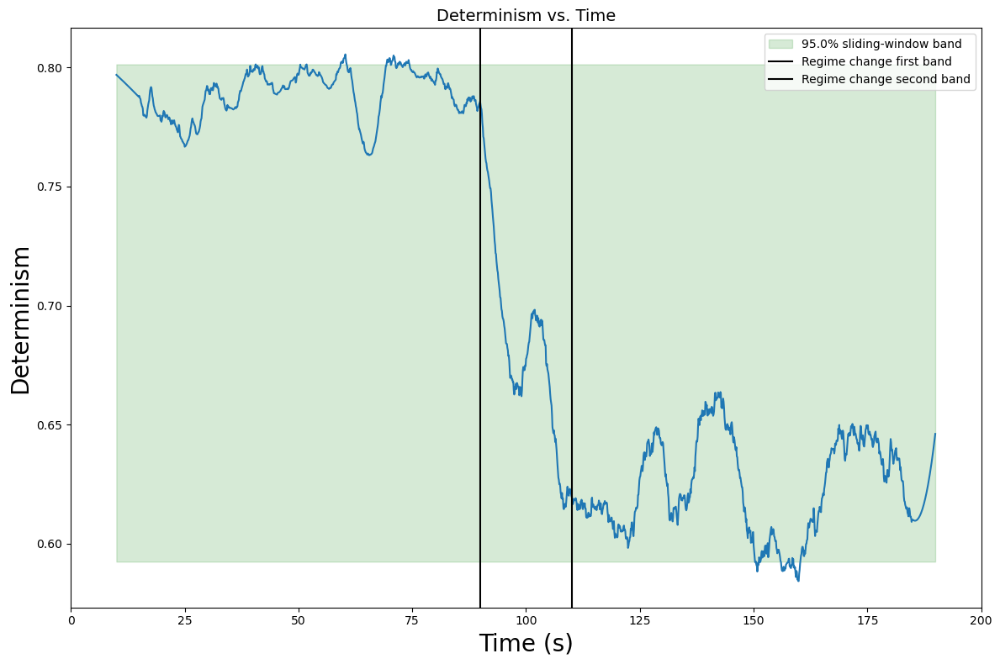

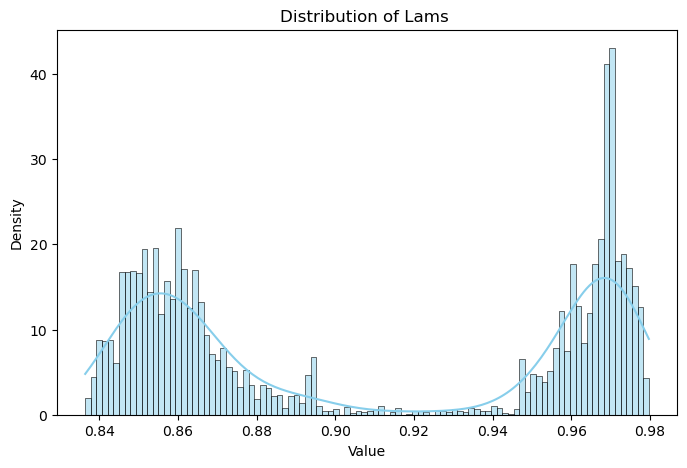

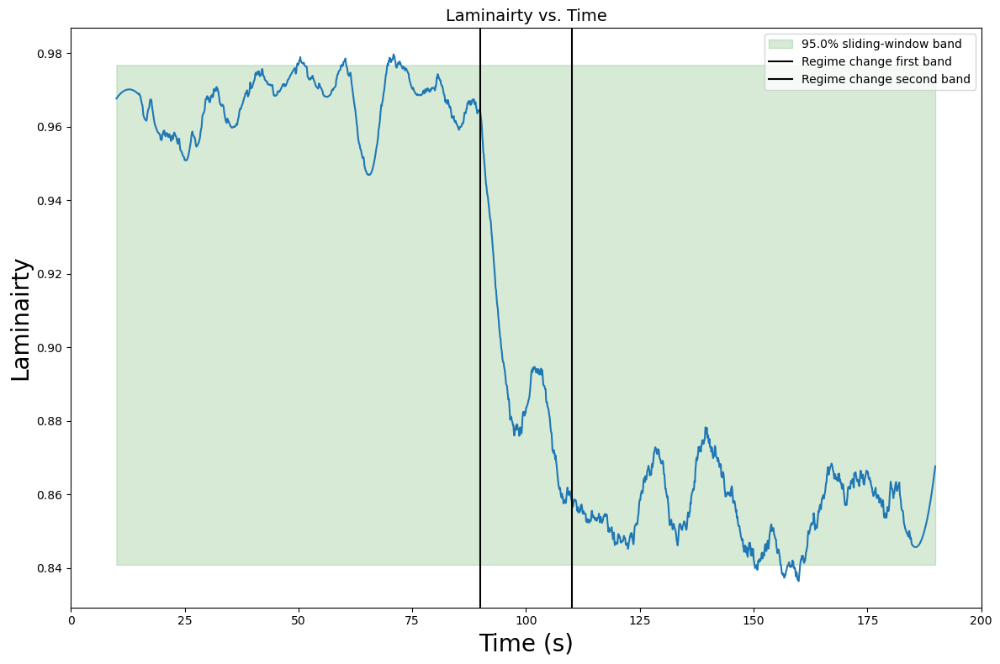

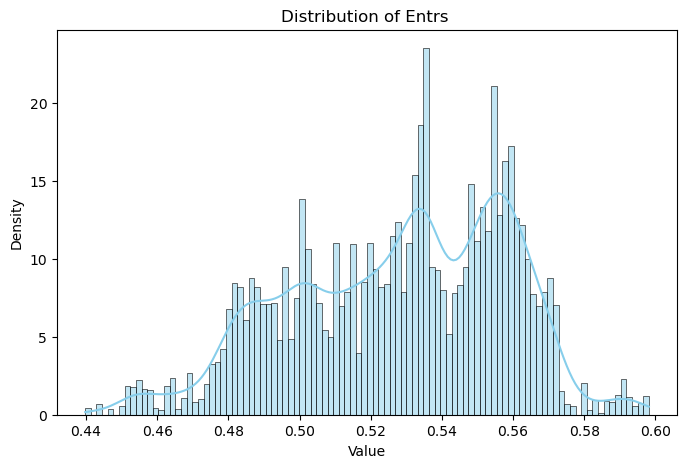

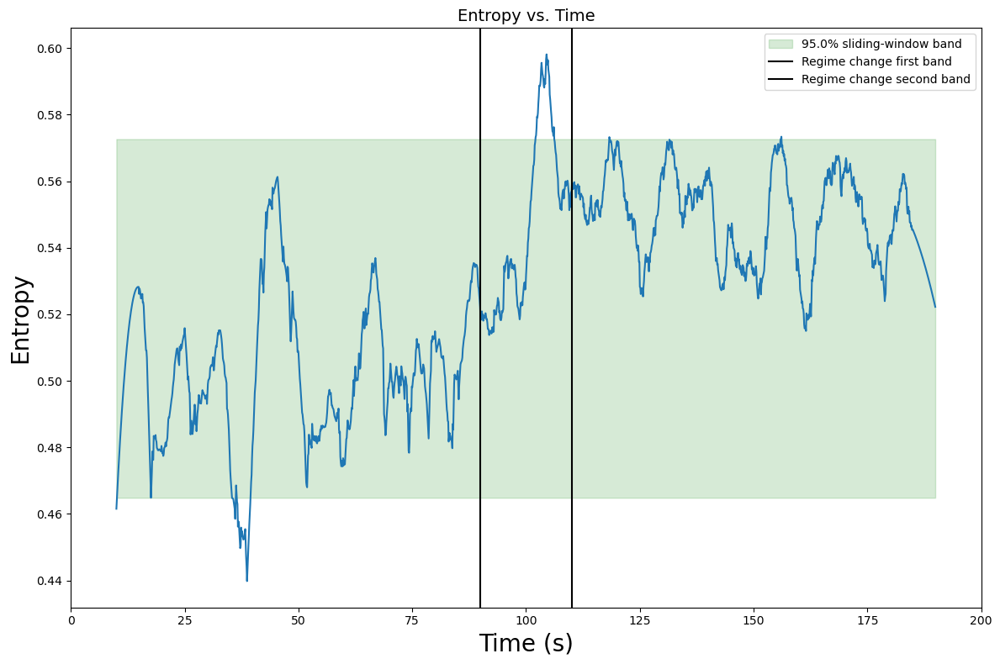

In [13]:
import seaborn as sns
def bootstrap_ci(sampled_metric,n,alpha=0.05,plot=False, metric_name=''):
    if plot:
        plt.figure(figsize=(8, 5))
        sns.histplot(sampled_metric, bins=len(sampled_metric)//100, kde=True, stat="density", color="skyblue", edgecolor="black")
        plt.title(f"Distribution of {metric_name} ")
        plt.xlabel("Value")
        plt.ylabel("Density")
        plt.show()
    lo, hi = np.percentile(sampled_metric, [100*alpha/2, 100*(1-alpha/2)])
    return lo,hi
def plotting(metric, metric_name, lo,hi, percent):
    plt.figure(figsize=(12,8))
    plt.plot(real_times, metric)
    plt.ylabel(f'{metric_name}', fontsize=20)
    plt.title(f'{metric_name} vs. Time', fontsize=14)
    plt.xlabel('Time (s)', fontsize=20)
    plt.xlim(0, total_time)
    plt.fill_between(real_times, lo, hi, alpha=0.16, label=f'{100-percent}% sliding-window band', zorder=1, color='green')
    plt.axvline(90, color='Black', linestyle='solid', label='Regime change first band')
    plt.axvline(110, color='Black', linestyle='solid', label='Regime change second band')
    plt.tight_layout()
    plt.legend()
    plt.show()
    
alpha=0.05
lo,hi = bootstrap_ci(sampled_dets,1,alpha=alpha,plot=True,metric_name='Dets')
plotting(DETS, 'Determinism',  lo,hi ,alpha*100)
lo,hi = bootstrap_ci(sampled_lams,1,alpha=alpha,plot=True,metric_name='Lams')
plotting(LAMS, 'Laminairty', lo,hi, alpha*100)
lo,hi = bootstrap_ci(sampled_entr,1,alpha=alpha,plot=True,metric_name='Entrs')
plotting(ENTRS, 'Entropy', lo,hi, alpha*100)

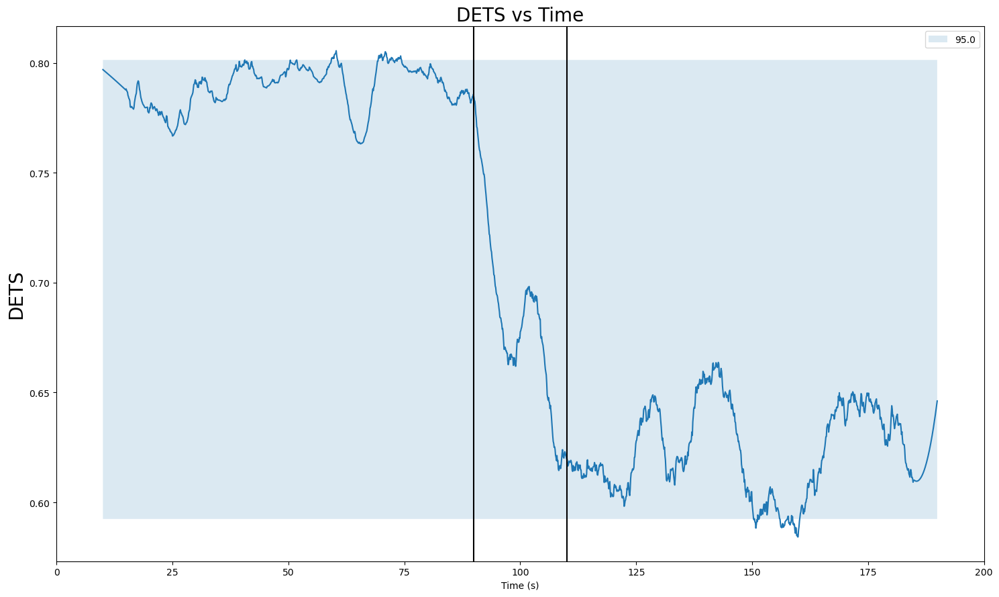

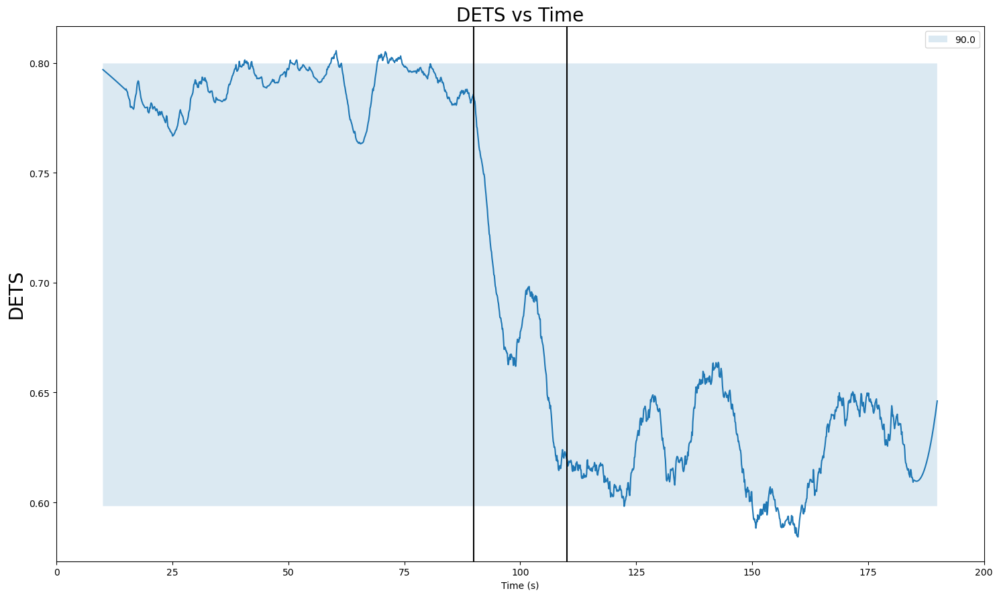

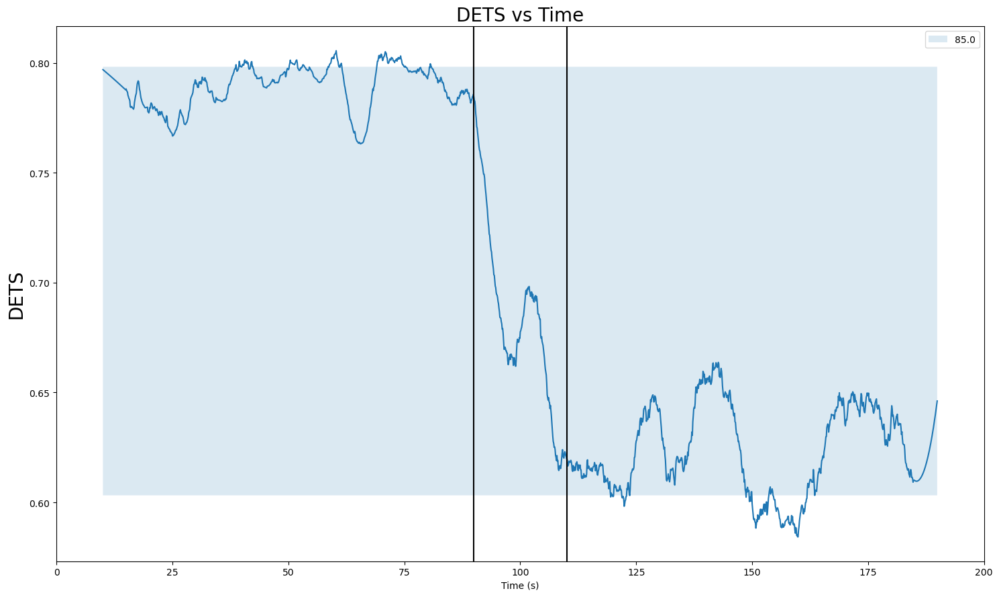

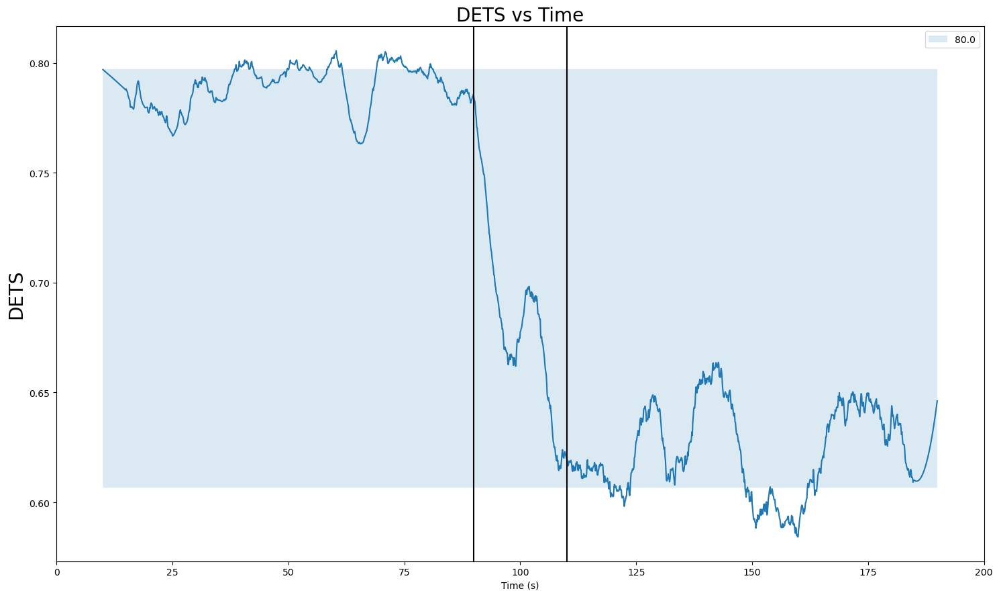

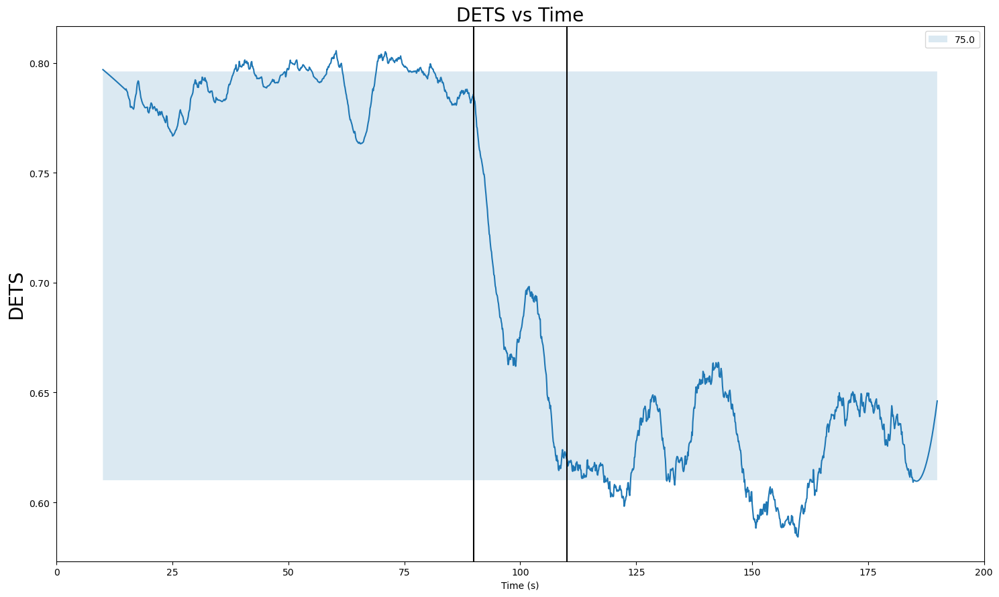

...

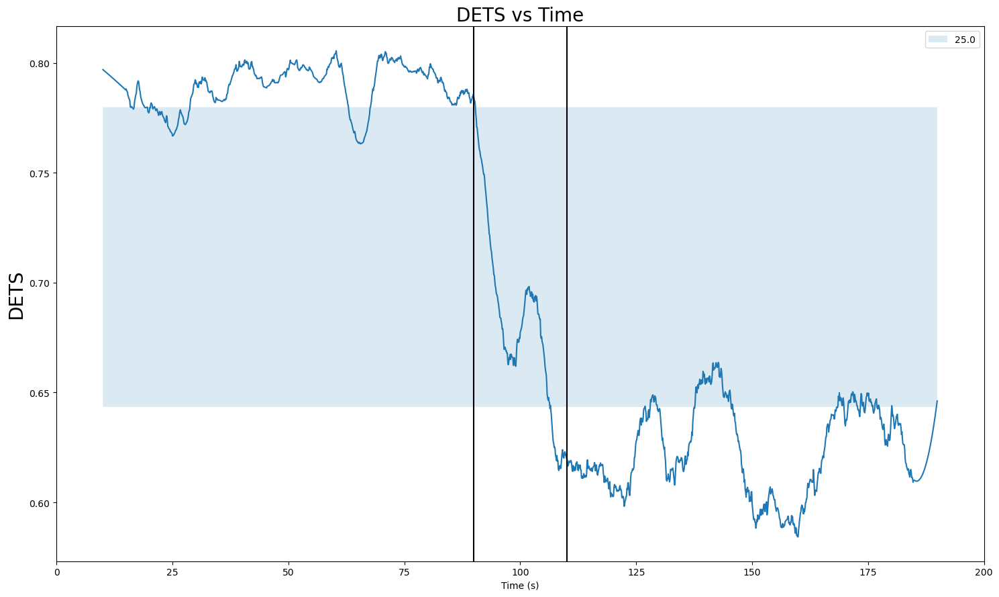

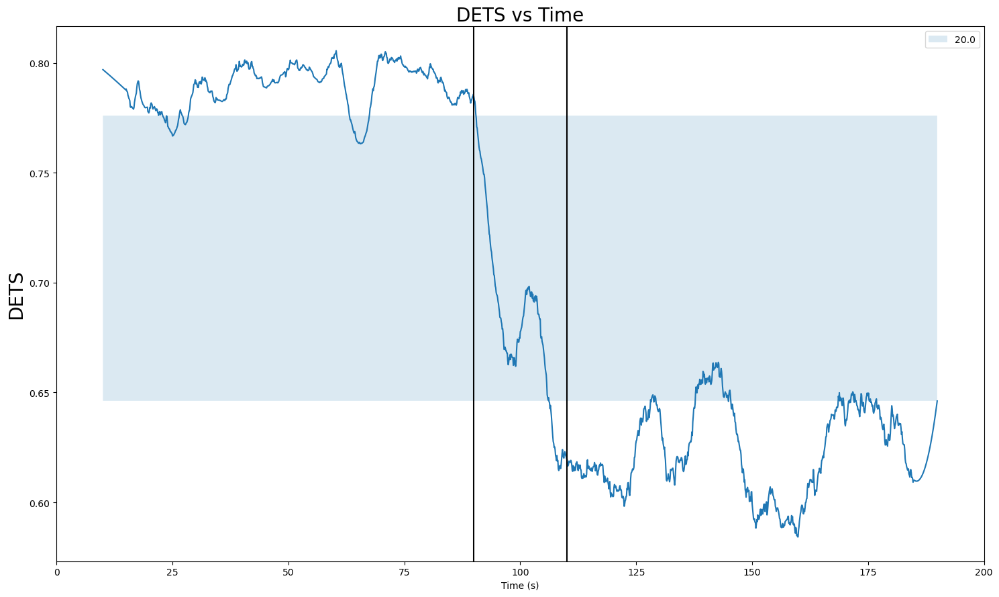

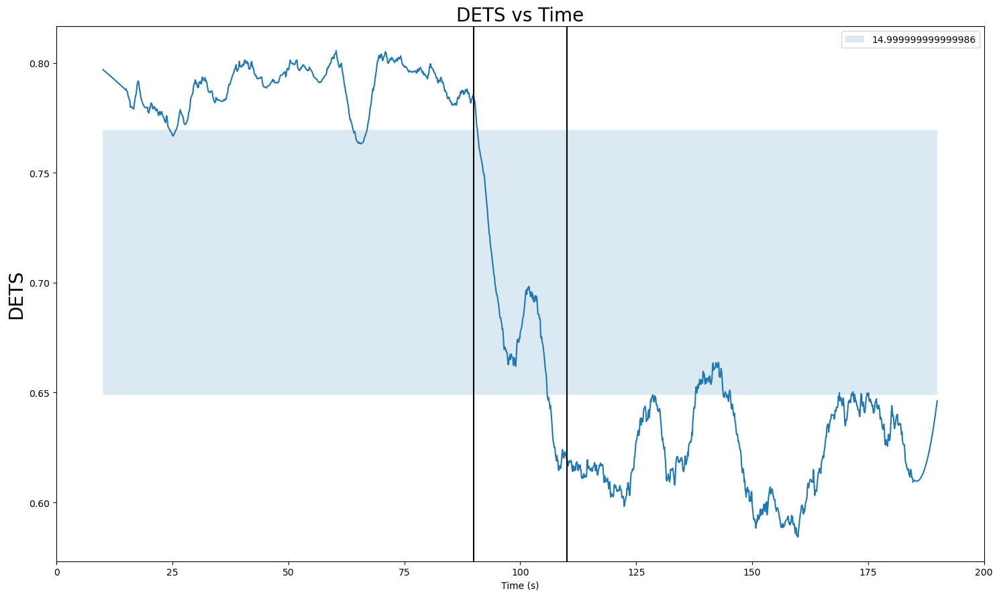

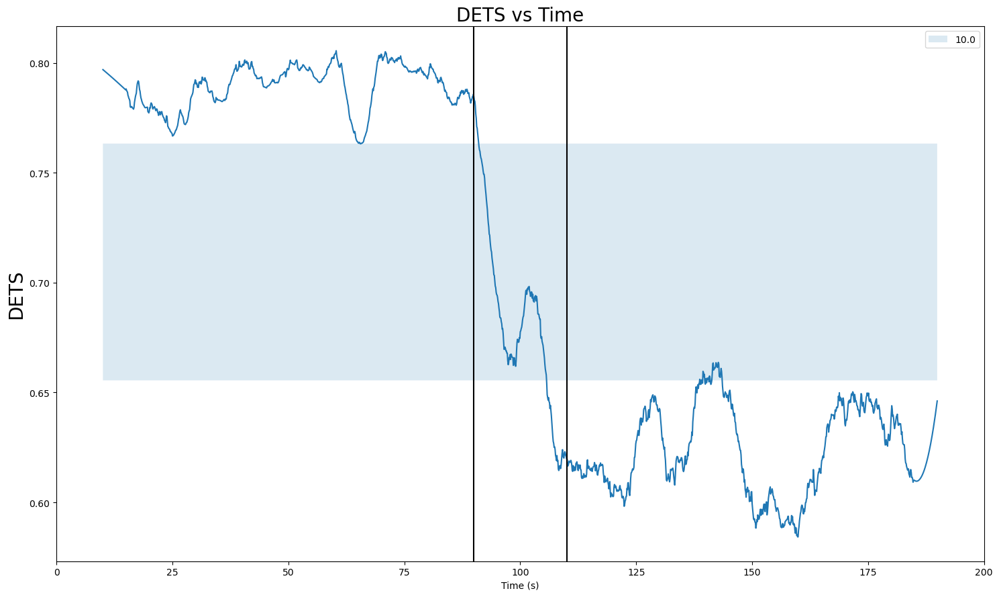

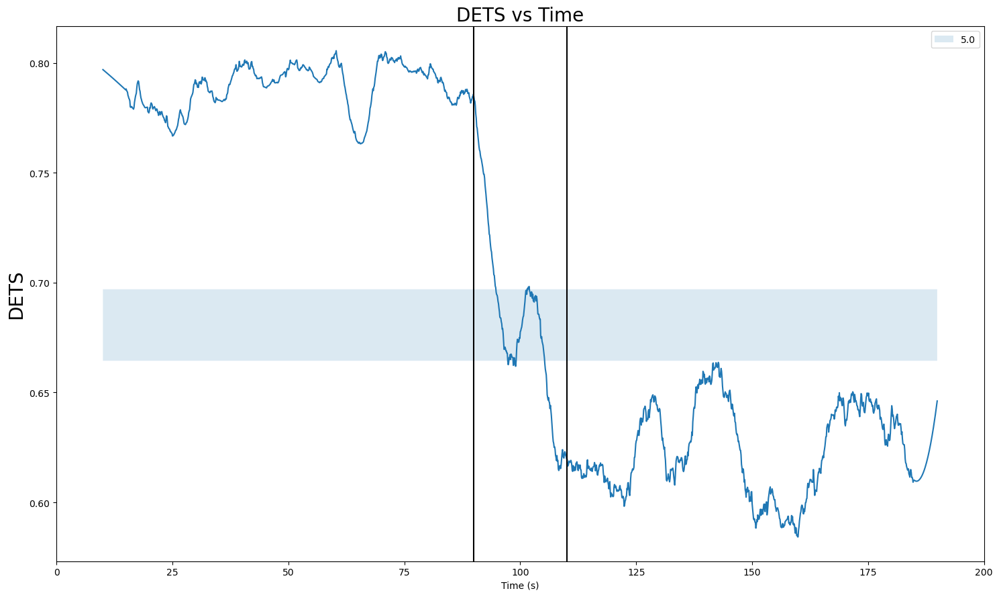

In [14]:
metric = DETS
metric_name = 'DETS'
alpha = 0.05
for i in range(1,20):
    plt.figure(figsize=(15,9))
    plt.plot(real_times,metric)
    plt.ylabel(f'{metric_name}', fontsize=20)
    plt.title(f'{metric_name} vs Time', fontsize =20)
    plt.xlabel('Time (s)')
    plt.xlim(0,total_time)
    plt.axvline(90, color='Black', linestyle='solid')
    plt.axvline(110,color='Black', linestyle='solid')
    alp = alpha * i 
    lo,hi = bootstrap_ci(sampled_dets,1,alpha=alp)
    plt.fill_between(real_times,lo,hi, alpha=0.16, label=f'{100-alp*100}')
    plt.tight_layout()
    plt.legend()
    plt.show()

[[0.96862745 0.98431373 1.         1.        ]
 [0.88250673 0.92919646 0.97244137 1.        ]
 [0.79935409 0.8740792  0.94488274 1.        ]
 [0.67189542 0.81437908 0.90065359 1.        ]
 [0.51058824 0.73230296 0.85883891 1.        ]
 [0.34646674 0.63240292 0.81067282 1.        ]
 [0.21568627 0.52941176 0.75424837 1.        ]
 [0.10557478 0.41262591 0.68596694 1.        ]
 [0.03137255 0.30191465 0.58840446 1.        ]
 [0.03137255 0.18823529 0.41960784 1.        ]]
0.9494444444444444


ValueError: array([[0.96862745, 0.98431373, 1.        , 1.        ],
       [0.88250673, 0.92919646, 0.97244137, 1.        ],
       [0.79935409, 0.8740792 , 0.94488274, 1.        ],
       [0.67189542, 0.81437908, 0.90065359, 1.        ],
       [0.51058824, 0.73230296, 0.85883891, 1.        ],
       [0.34646674, 0.63240292, 0.81067282, 1.        ],
       [0.21568627, 0.52941176, 0.75424837, 1.        ],
       [0.10557478, 0.41262591, 0.68596694, 1.        ],
       [0.03137255, 0.30191465, 0.58840446, 1.        ],
       [0.03137255, 0.18823529, 0.41960784, 1.        ]]) is not a valid value for cmap; supported values are 'Accent', 'Accent_r', 'Blues', 'Blues_r', 'BrBG', 'BrBG_r', 'BuGn', 'BuGn_r', 'BuPu', 'BuPu_r', 'CMRmap', 'CMRmap_r', 'Dark2', 'Dark2_r', 'GnBu', 'GnBu_r', 'Greens', 'Greens_r', 'Greys', 'Greys_r', 'OrRd', 'OrRd_r', 'Oranges', 'Oranges_r', 'PRGn', 'PRGn_r', 'Paired', 'Paired_r', 'Pastel1', 'Pastel1_r', 'Pastel2', 'Pastel2_r', 'PiYG', 'PiYG_r', 'PuBu', 'PuBuGn', 'PuBuGn_r', 'PuBu_r', 'PuOr', 'PuOr_r', 'PuRd', 'PuRd_r', 'Purples', 'Purples_r', 'RdBu', 'RdBu_r', 'RdGy', 'RdGy_r', 'RdPu', 'RdPu_r', 'RdYlBu', 'RdYlBu_r', 'RdYlGn', 'RdYlGn_r', 'Reds', 'Reds_r', 'Set1', 'Set1_r', 'Set2', 'Set2_r', 'Set3', 'Set3_r', 'Spectral', 'Spectral_r', 'Wistia', 'Wistia_r', 'YlGn', 'YlGnBu', 'YlGnBu_r', 'YlGn_r', 'YlOrBr', 'YlOrBr_r', 'YlOrRd', 'YlOrRd_r', 'afmhot', 'afmhot_r', 'autumn', 'autumn_r', 'binary', 'binary_r', 'bone', 'bone_r', 'brg', 'brg_r', 'bwr', 'bwr_r', 'cividis', 'cividis_r', 'cool', 'cool_r', 'coolwarm', 'coolwarm_r', 'copper', 'copper_r', 'crest', 'crest_r', 'cubehelix', 'cubehelix_r', 'flag', 'flag_r', 'flare', 'flare_r', 'gist_earth', 'gist_earth_r', 'gist_gray', 'gist_gray_r', 'gist_heat', 'gist_heat_r', 'gist_ncar', 'gist_ncar_r', 'gist_rainbow', 'gist_rainbow_r', 'gist_stern', 'gist_stern_r', 'gist_yarg', 'gist_yarg_r', 'gnuplot', 'gnuplot2', 'gnuplot2_r', 'gnuplot_r', 'gray', 'gray_r', 'hot', 'hot_r', 'hsv', 'hsv_r', 'icefire', 'icefire_r', 'inferno', 'inferno_r', 'jet', 'jet_r', 'magma', 'magma_r', 'mako', 'mako_r', 'nipy_spectral', 'nipy_spectral_r', 'ocean', 'ocean_r', 'pink', 'pink_r', 'plasma', 'plasma_r', 'prism', 'prism_r', 'rainbow', 'rainbow_r', 'rocket', 'rocket_r', 'seismic', 'seismic_r', 'spring', 'spring_r', 'summer', 'summer_r', 'tab10', 'tab10_r', 'tab20', 'tab20_r', 'tab20b', 'tab20b_r', 'tab20c', 'tab20c_r', 'terrain', 'terrain_r', 'turbo', 'turbo_r', 'twilight', 'twilight_r', 'twilight_shifted', 'twilight_shifted_r', 'viridis', 'viridis_r', 'vlag', 'vlag_r', 'winter', 'winter_r'

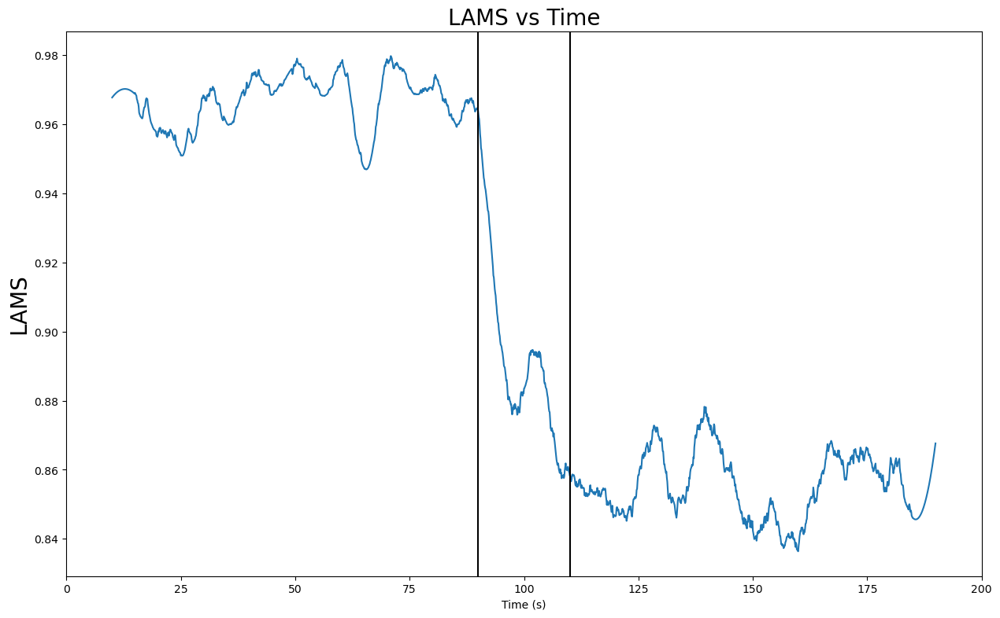

In [34]:
metric = LAMS
metric_name = 'LAMS'
alpha = 0.05

cmap = plt.cm.get_cmap('Blues')

# Define the number of distinct colors you want from the colormap
num_colors = 10  # For example, to get 10 distinct shades

# Create an array of values from 0 to 1, representing the range of the colormap
# These values will be used to sample the colormap
sample_points = np.linspace(0, 1, num_colors)

# Apply the colormap to the sample points to get an array of RGBA color values
colors_array = cmap(sample_points)
print(colors_array)

plt.figure(figsize=(15,9))
plt.plot(real_times,metric)
plt.ylabel(f'{metric_name}', fontsize=20)
plt.title(f'{metric_name} vs Time', fontsize =20)
plt.xlabel('Time (s)')
plt.xlim(0,total_time)
plt.axvline(90, color='Black', linestyle='solid')
plt.axvline(110,color='Black', linestyle='solid')
for i in range(1,20):
    alp = alpha * i 
    lo,hi = bootstrap_ci(sampled_lams,1,alpha=alp)
    condition = (metric >= lo) & (metric <= hi)

    count = np.sum(condition) / len(metric)
    print(count)
    plt.fill_between(real_times,lo,hi, alpha=0.16, label=f'{100-alp*100}',cmap=colors_array)
plt.tight_layout()
plt.legend()
plt.show()

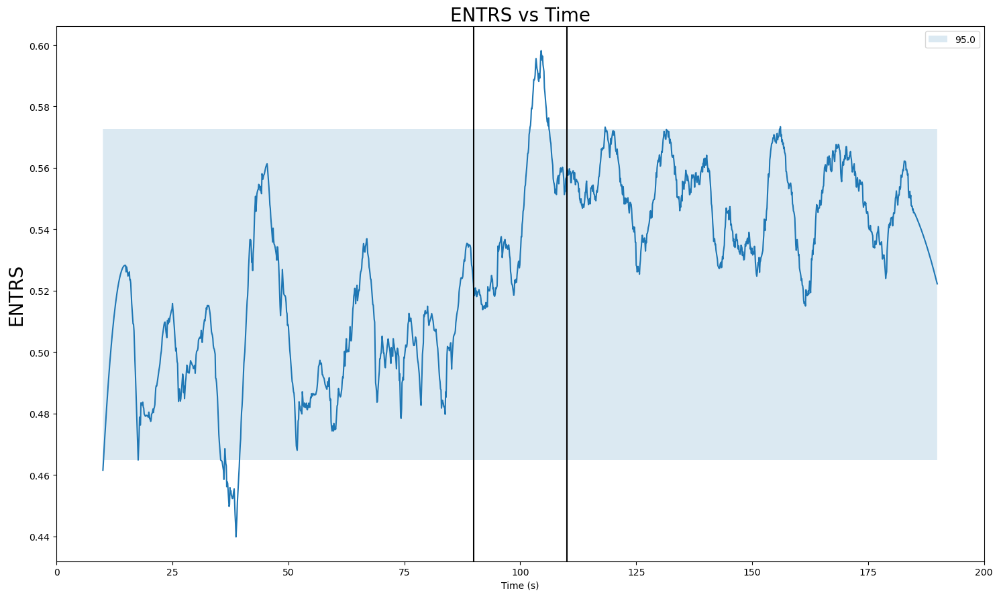

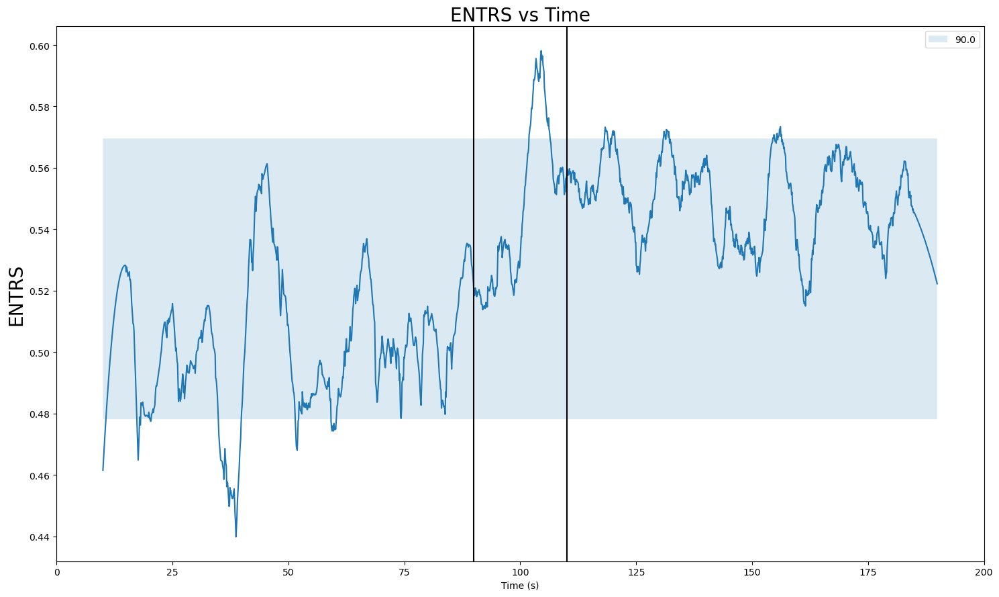

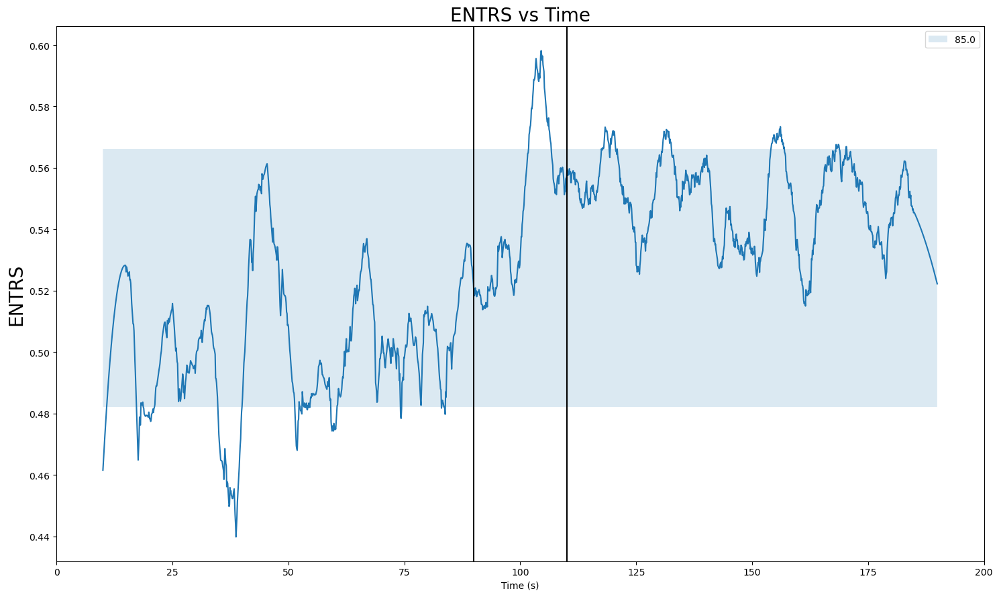

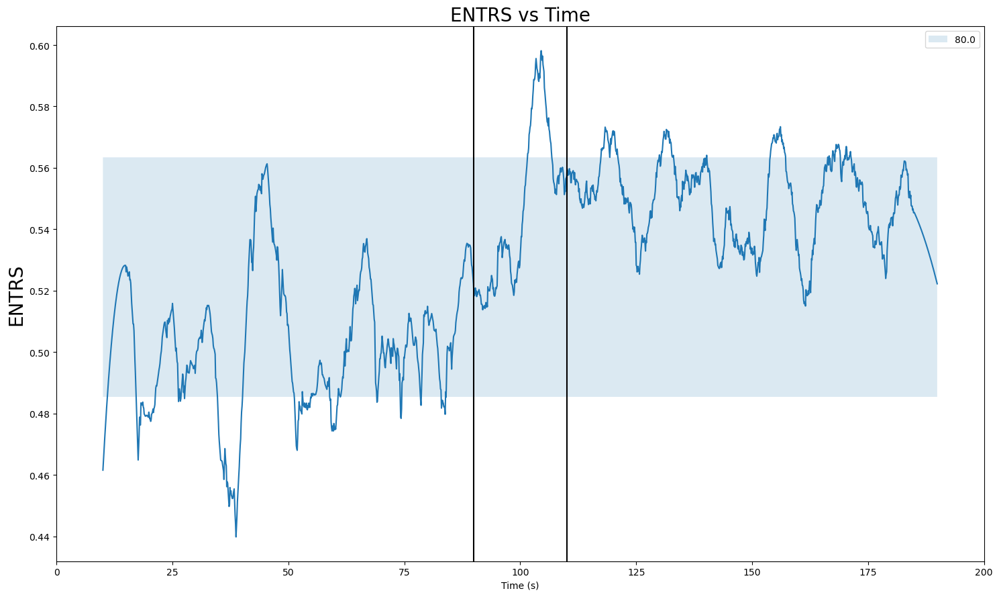

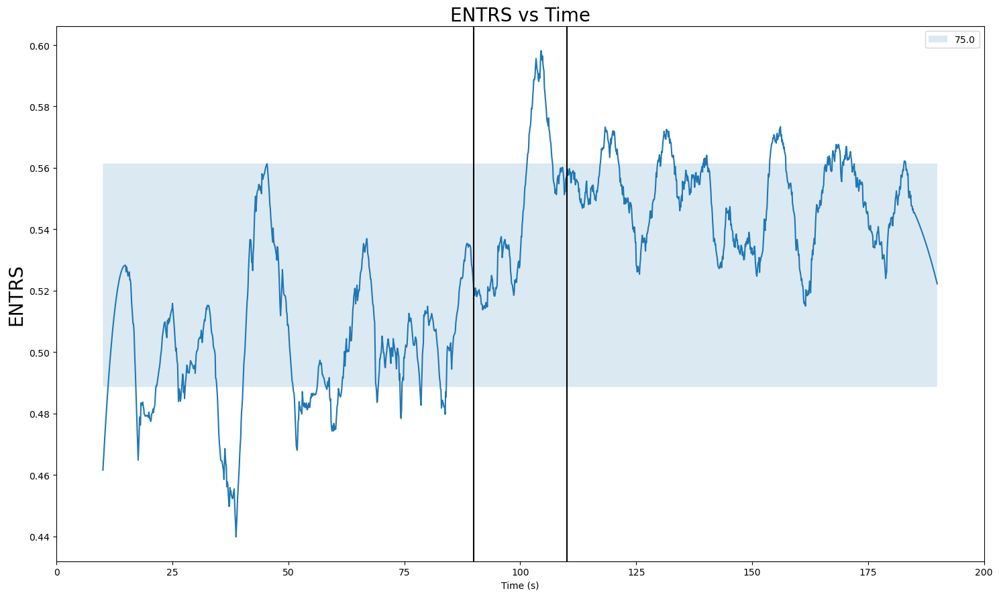

...

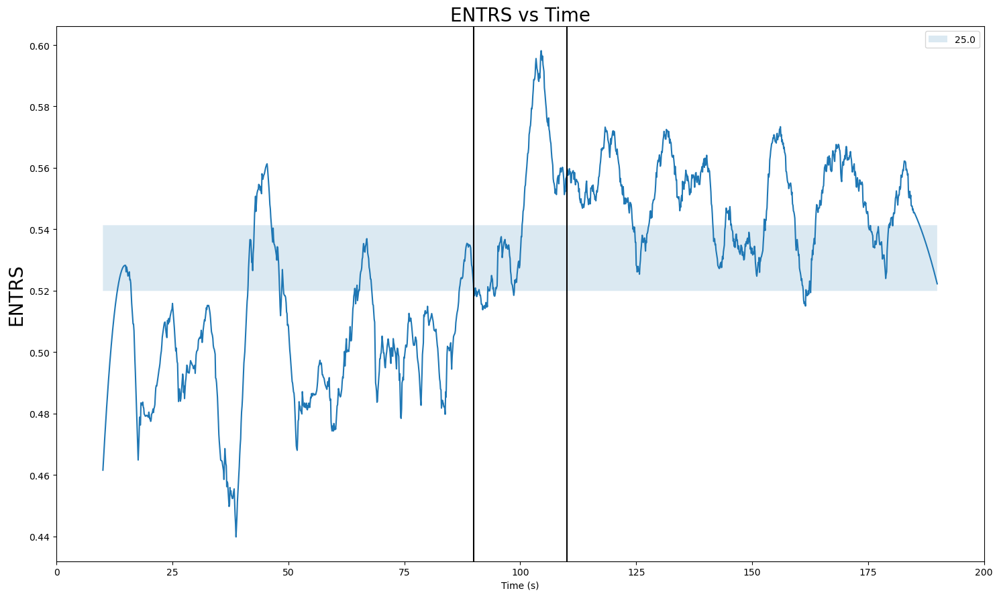

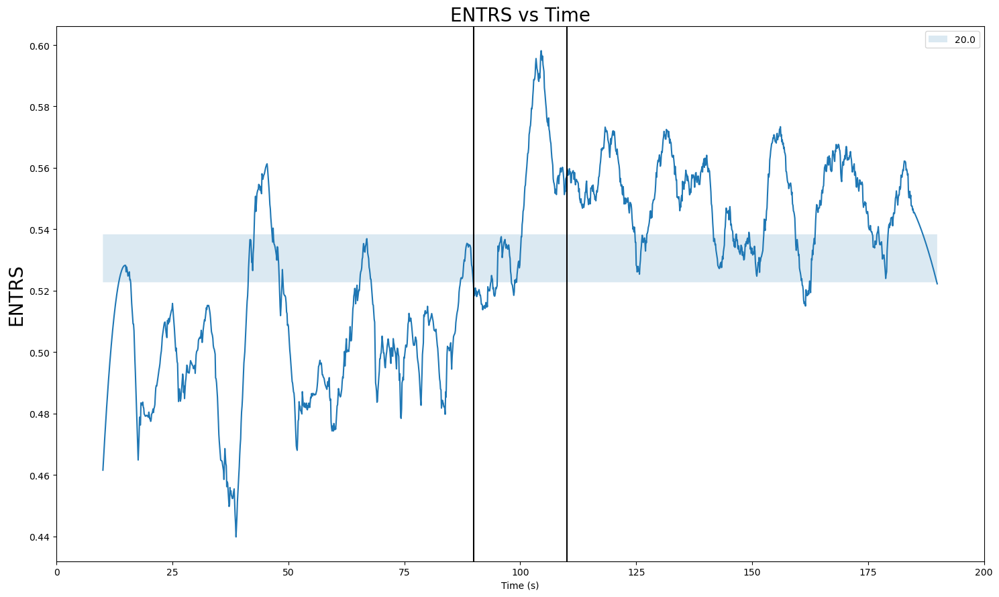

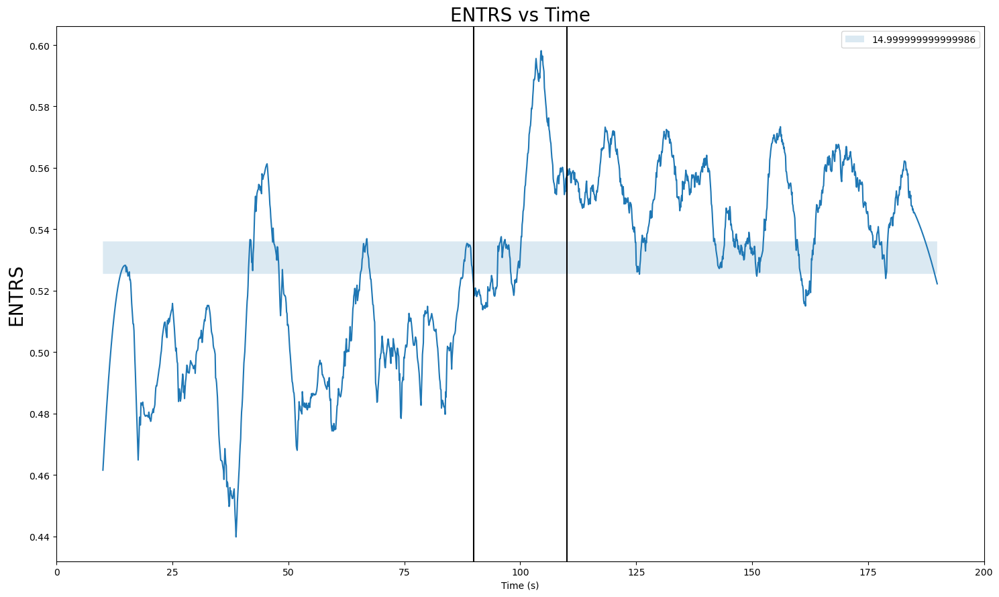

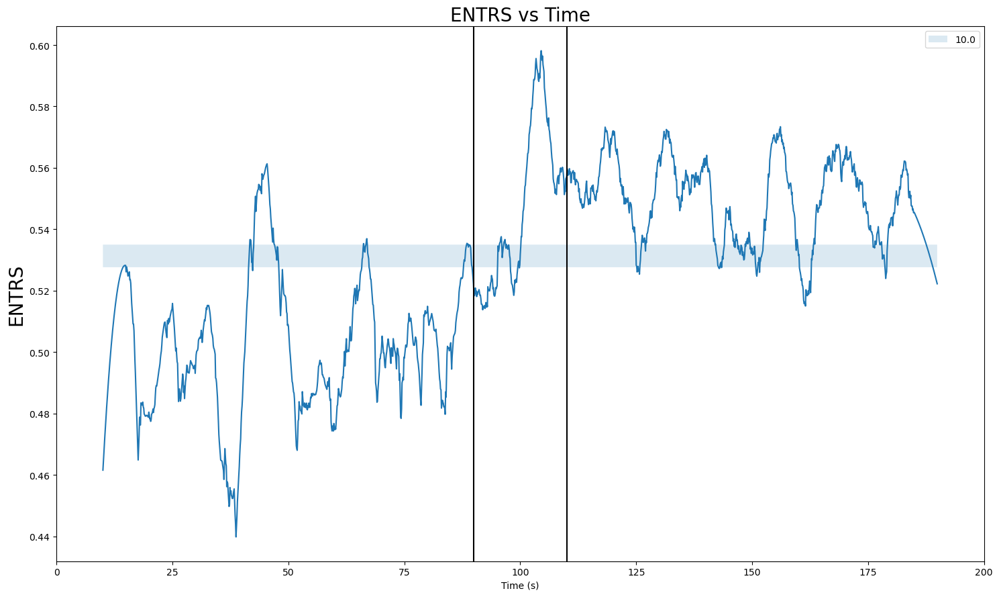

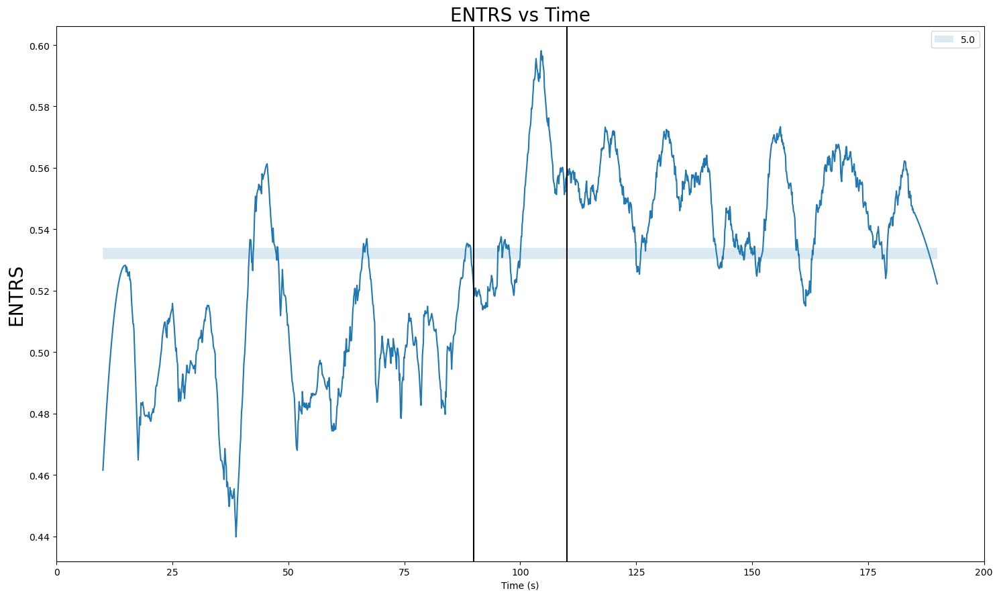

In [16]:
metric = ENTRS
metric_name = 'ENTRS'
alpha = 0.05
for i in range(1,20):
    plt.figure(figsize=(15,9))
    plt.plot(real_times,metric)
    plt.ylabel(f'{metric_name}', fontsize=20)
    plt.title(f'{metric_name} vs Time', fontsize =20)
    plt.xlabel('Time (s)')
    plt.xlim(0,total_time)
    plt.axvline(90, color='Black', linestyle='solid')
    plt.axvline(110,color='Black', linestyle='solid')
    alp = alpha * i 
    lo,hi = bootstrap_ci(sampled_entr,1,alpha=alp)
    plt.fill_between(real_times,lo,hi, alpha=0.16, label=f'{100-alp*100}')
    plt.tight_layout()
    plt.legend()
    plt.show()
    
    

In [17]:
new_DETS = DETS[750 : 1050]
new_LAMS = LAMS[750 : 1050]
new_ENTRS = ENTRS[750 : 1050]
new_times = times[750 : 1050]
new_DETS.shape

(300,)

In [18]:
print(new_times)

[ 850  851  852  853  854  855  856  857  858  859  860  861  862  863
  864  865  866  867  868  869  870  871  872  873  874  875  876  877
  878  879  880  881  882  883  884  885  886  887  888  889  890  891
  892  893  894  895  896  897  898  899  900  901  902  903  904  905
  906  907  908  909  910  911  912  913  914  915  916  917  918  919
  920  921  922  923  924  925  926  927  928  929  930  931  932  933
  934  935  936  937  938  939  940  941  942  943  944  945  946  947
  948  949  950  951  952  953  954  955  956  957  958  959  960  961
  962  963  964  965  966  967  968  969  970  971  972  973  974  975
  976  977  978  979  980  981  982  983  984  985  986  987  988  989
  990  991  992  993  994  995  996  997  998  999 1000 1001 1002 1003
 1004 1005 1006 1007 1008 1009 1010 1011 1012 1013 1014 1015 1016 1017
 1018 1019 1020 1021 1022 1023 1024 1025 1026 1027 1028 1029 1030 1031
 1032 1033 1034 1035 1036 1037 1038 1039 1040 1041 1042 1043 1044 1045
 1046 

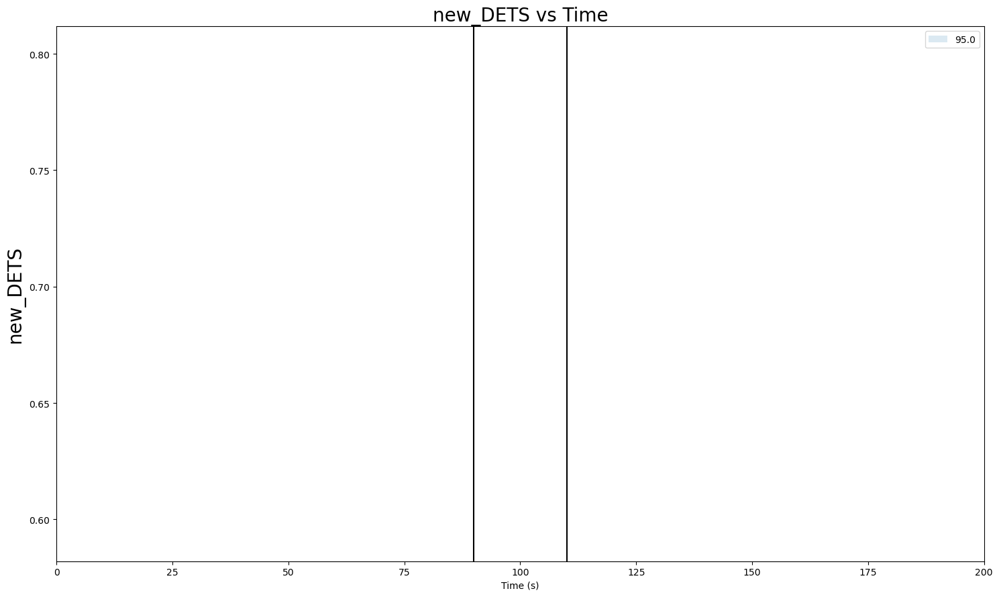

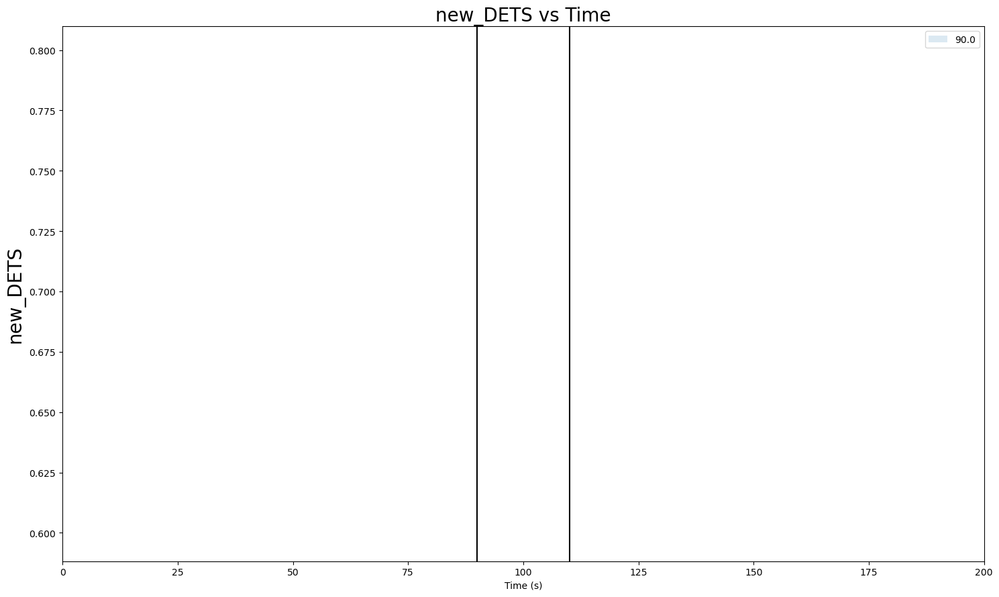

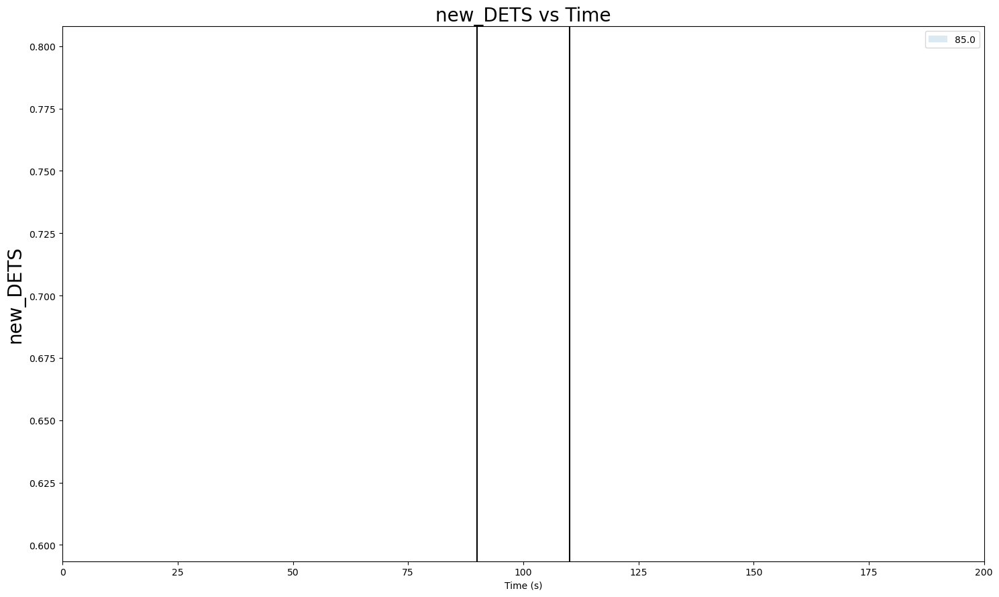

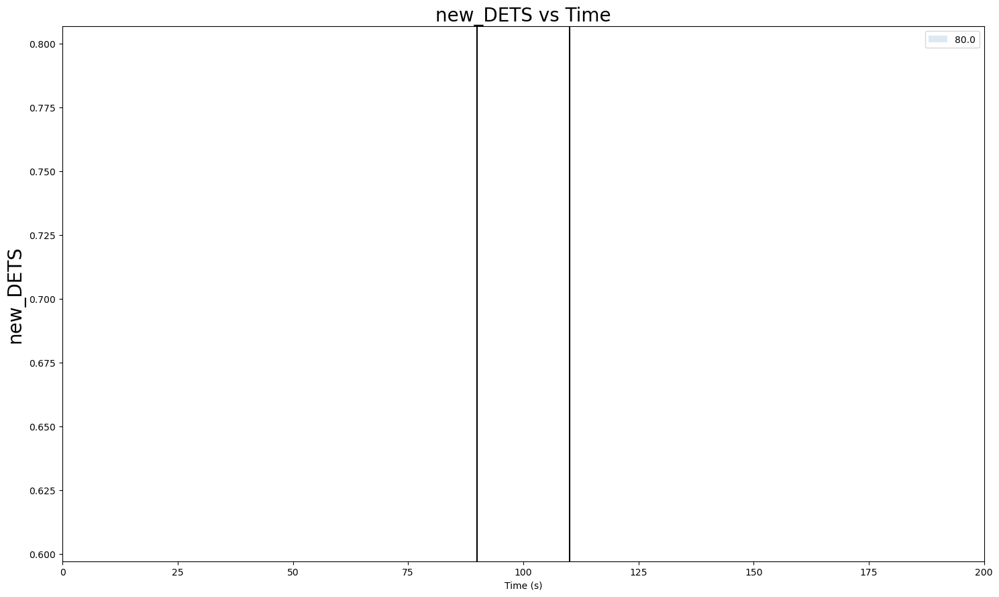

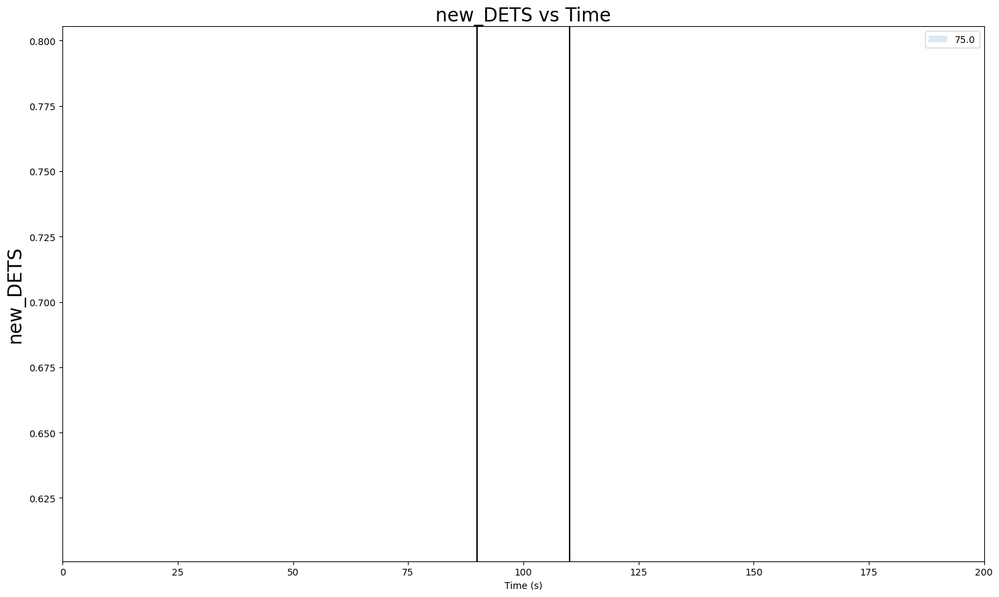

...

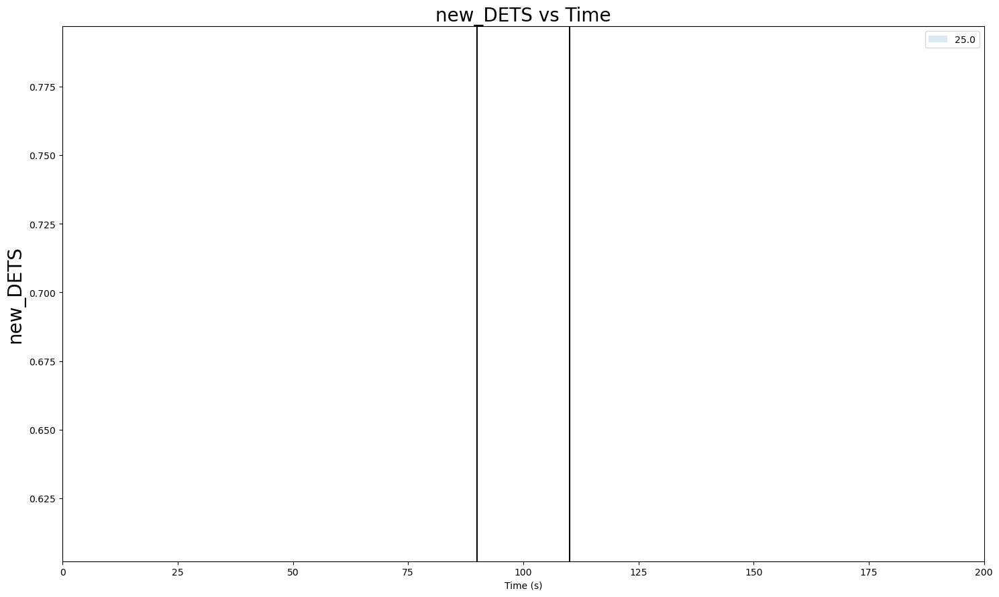

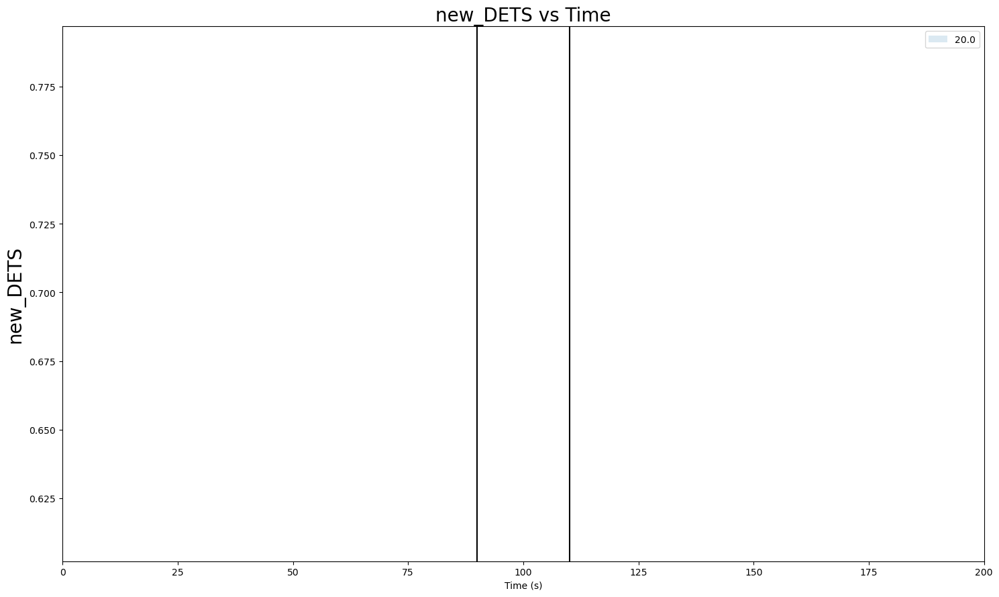

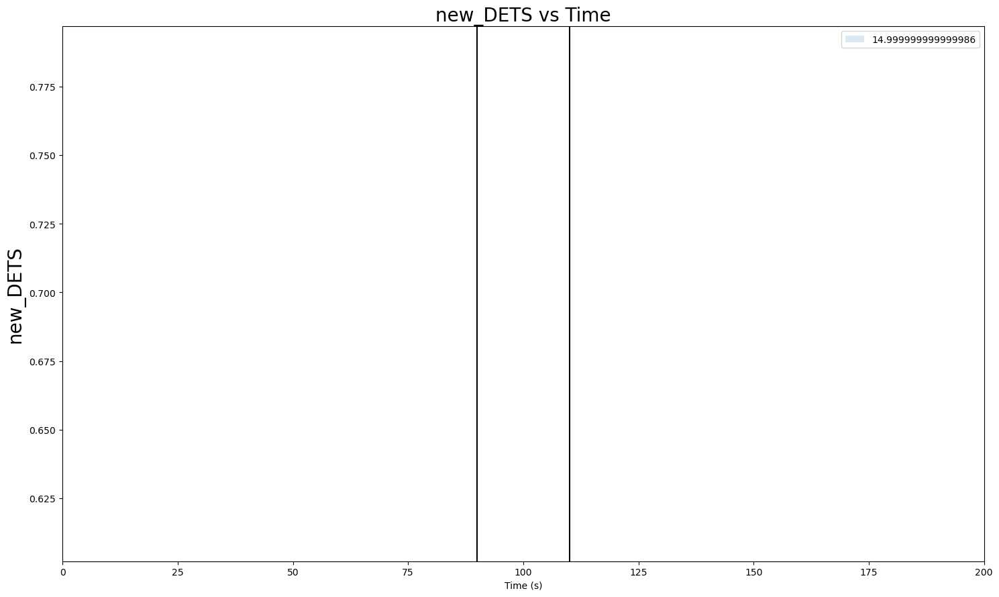

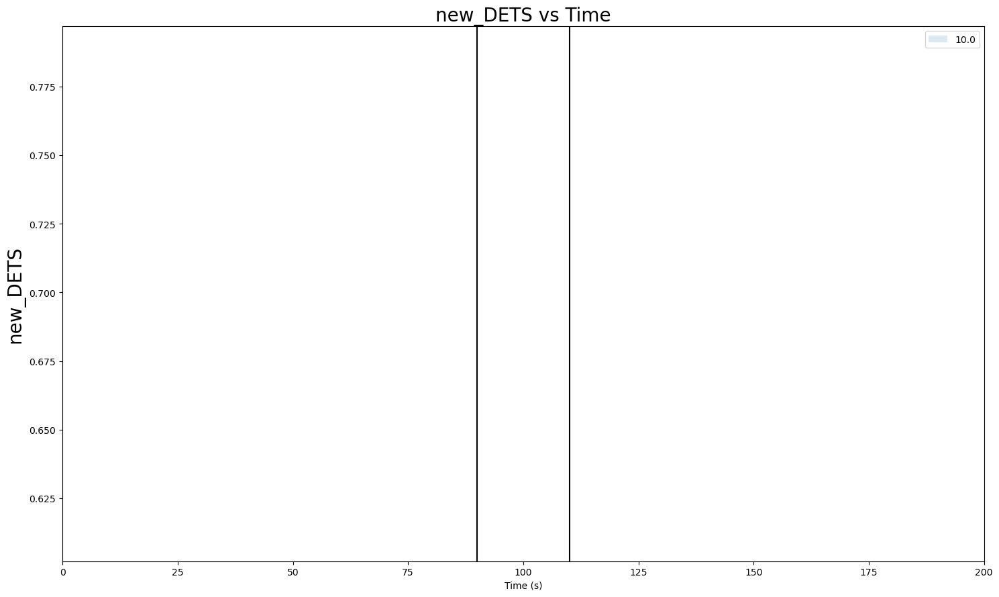

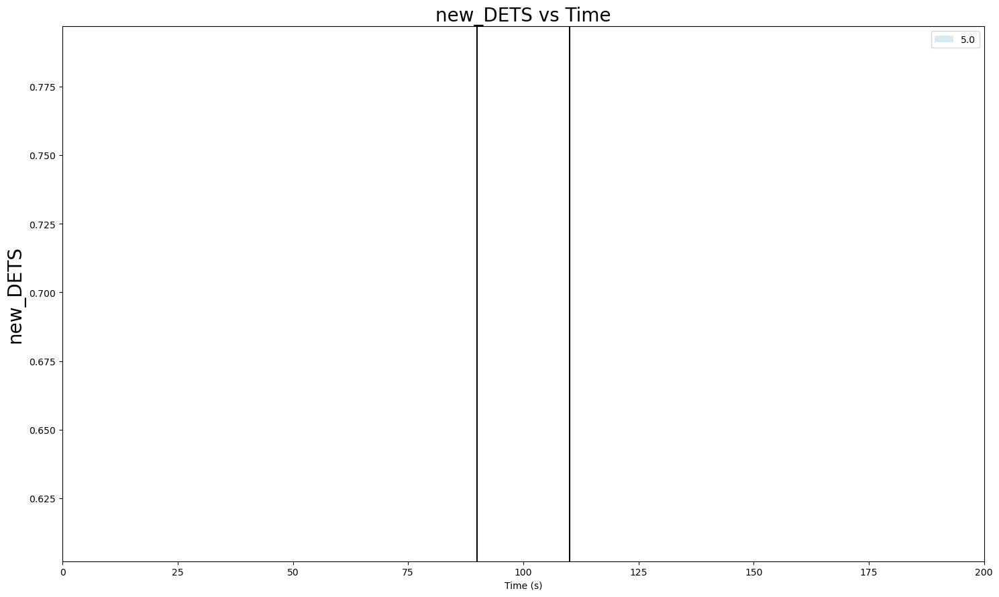

In [19]:
metric = new_DETS
metric_name = 'new_DETS'
alpha = 0.05
for i in range(1,20):
    plt.figure(figsize=(15,9))
    plt.plot(new_times,metric)
    plt.ylabel(f'{metric_name}', fontsize=20)
    plt.title(f'{metric_name} vs Time', fontsize =20)
    plt.xlabel('Time (s)')
    plt.xlim(0,total_time)
    plt.axvline(90, color='Black', linestyle='solid')
    plt.axvline(110,color='Black', linestyle='solid')
    alp = alpha * i 
    lo,hi = bootstrap_ci(sampled_dets,1,alpha=alp)
    plt.fill_between(new_times,lo,hi, alpha=0.16, label=f'{100-alp*100}')
    plt.tight_layout()
    plt.legend()
    plt.show()

1.0


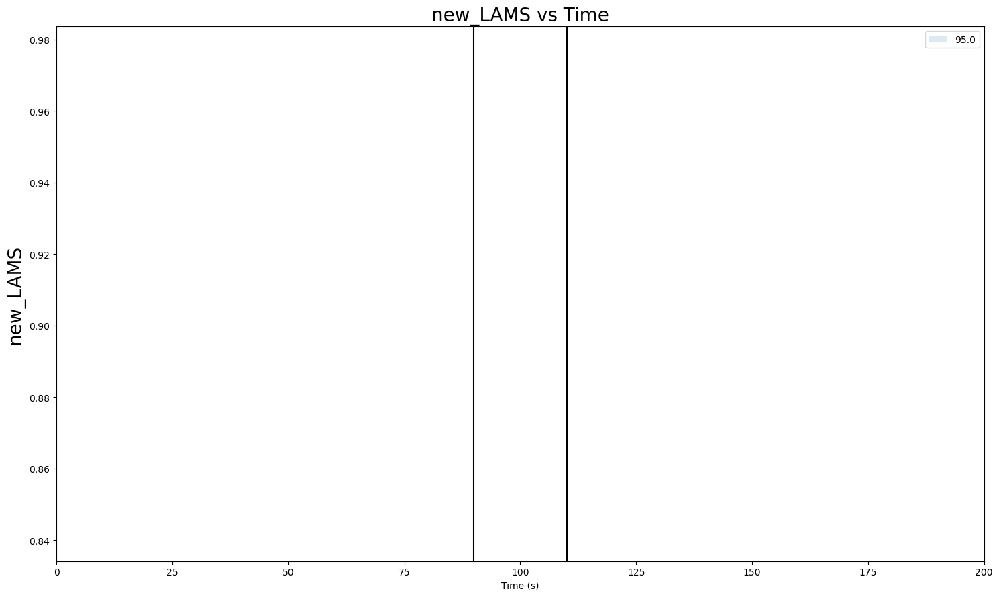

1.0


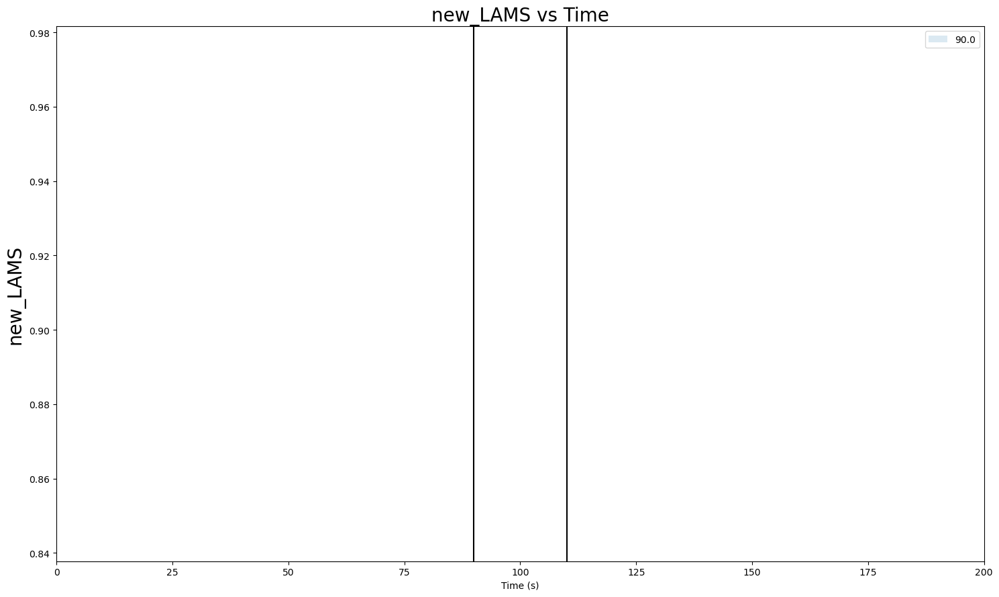

1.0


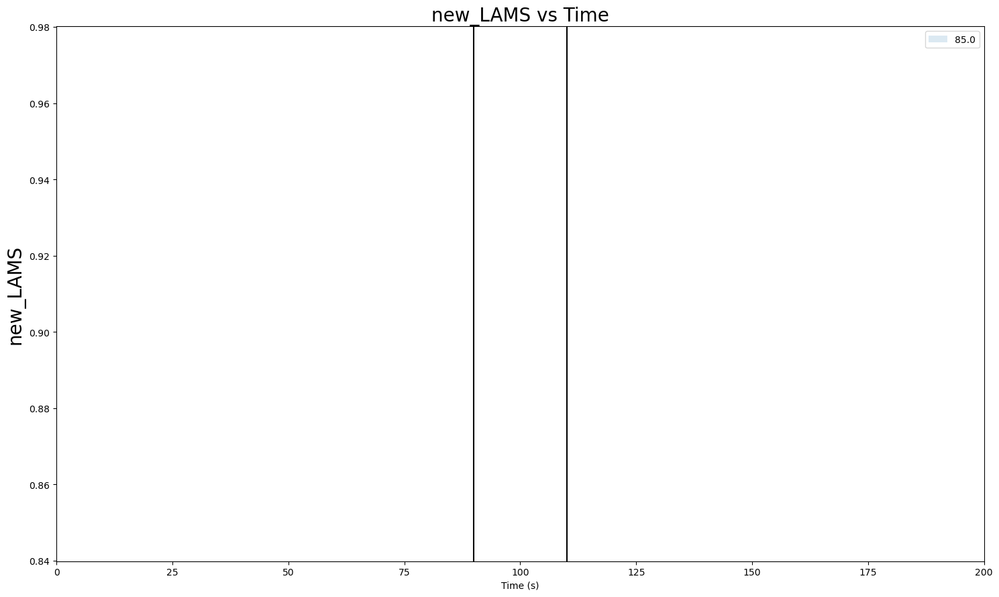

1.0


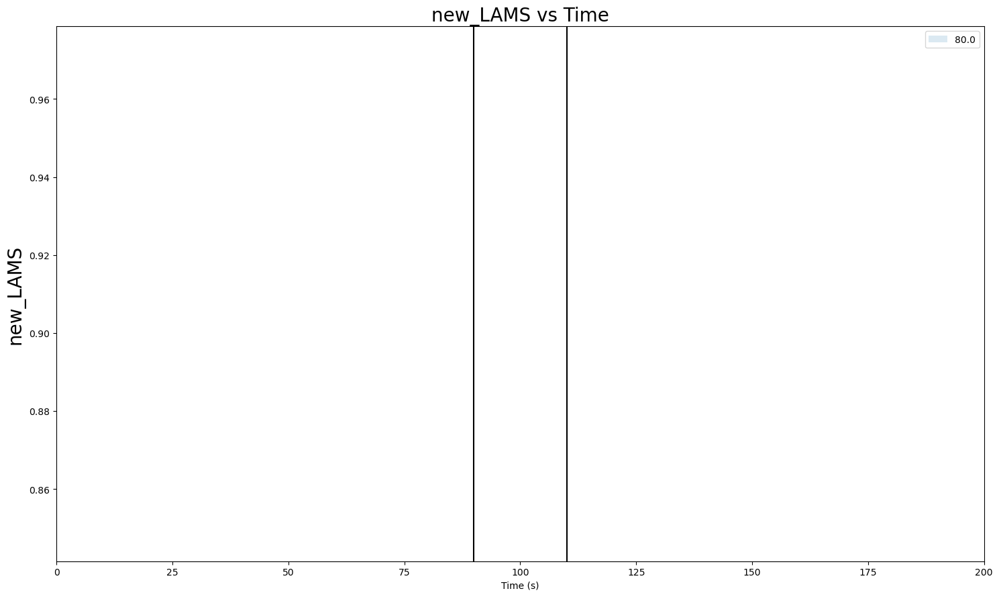

1.0


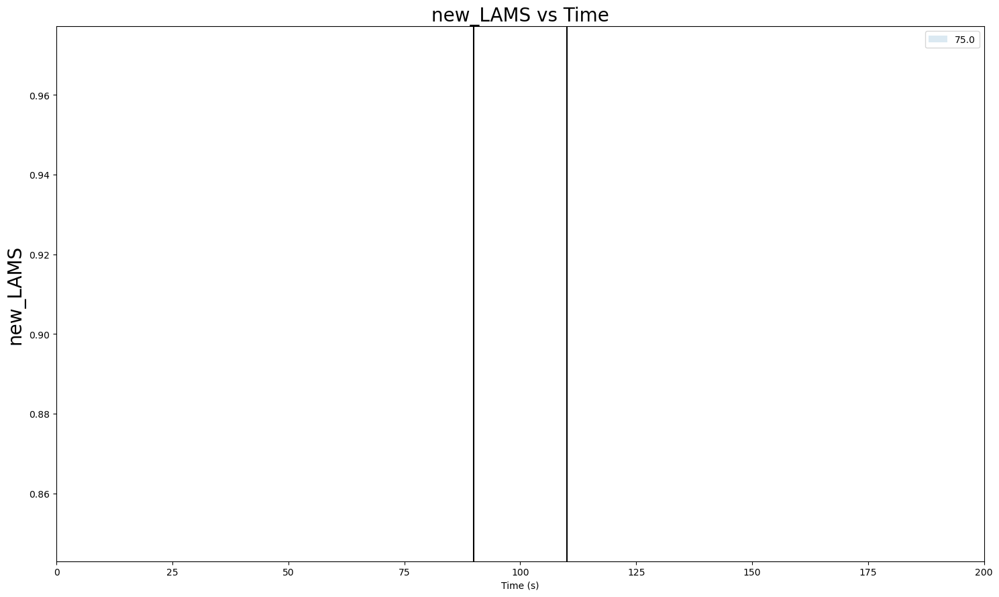

1.0


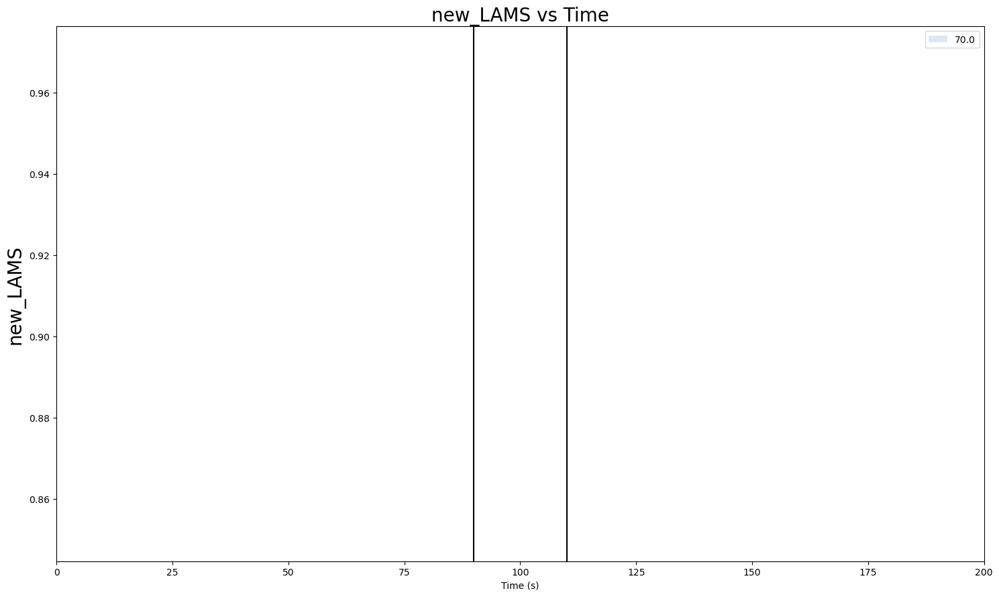

1.0


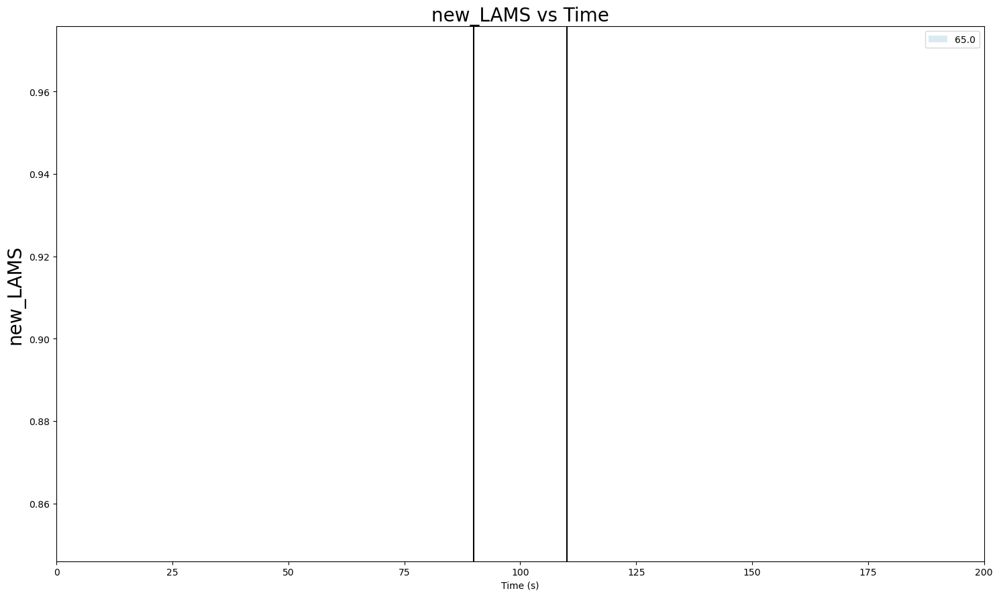

0.96


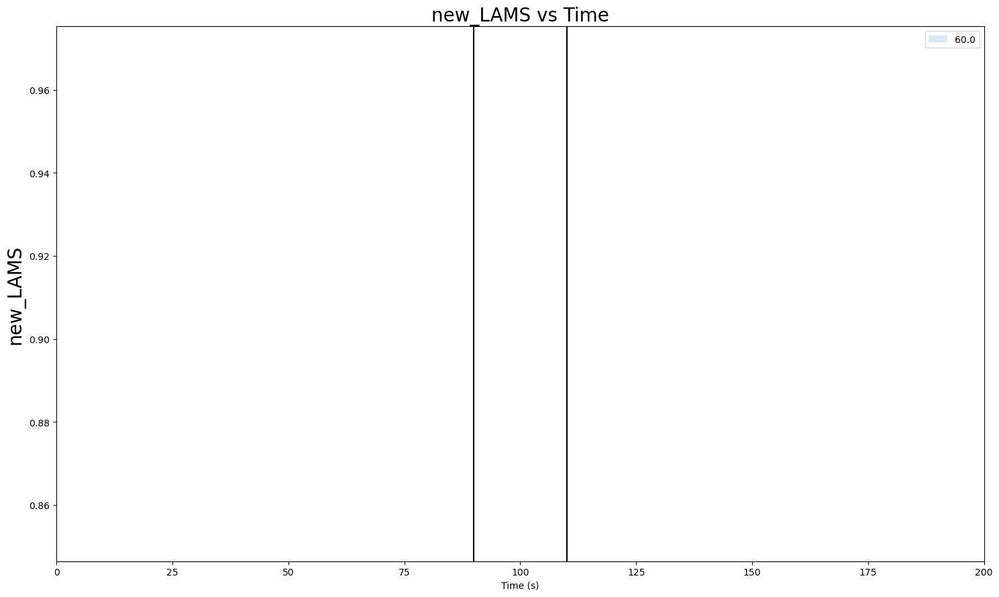

0.93


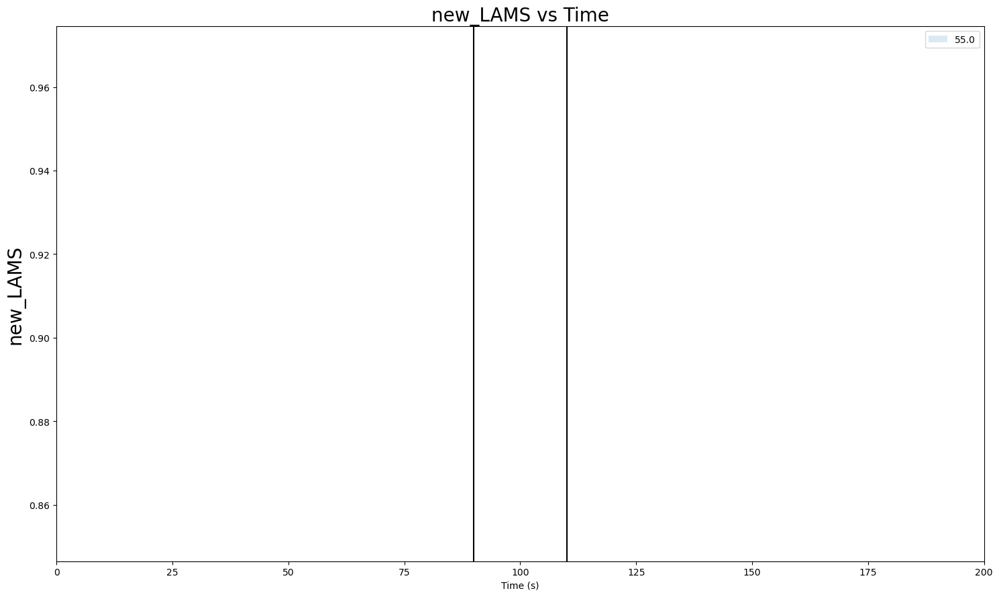

0.8833333333333333


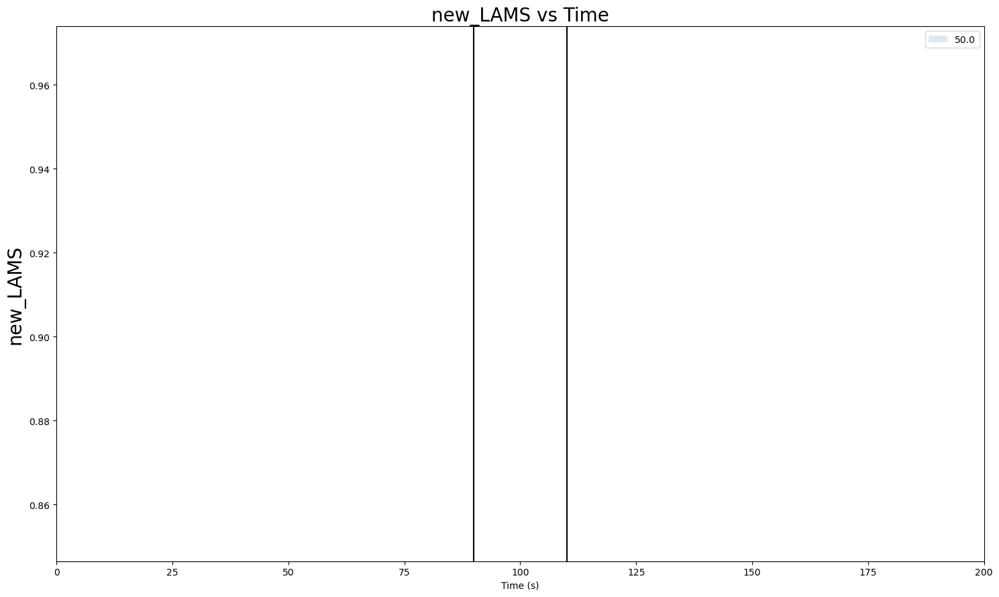

0.7933333333333333


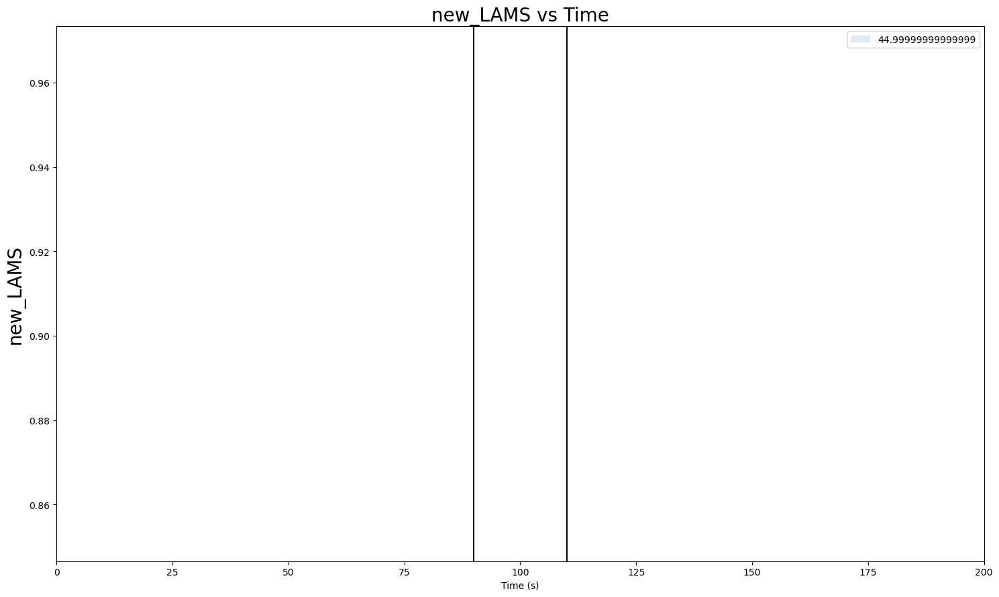

0.7166666666666667


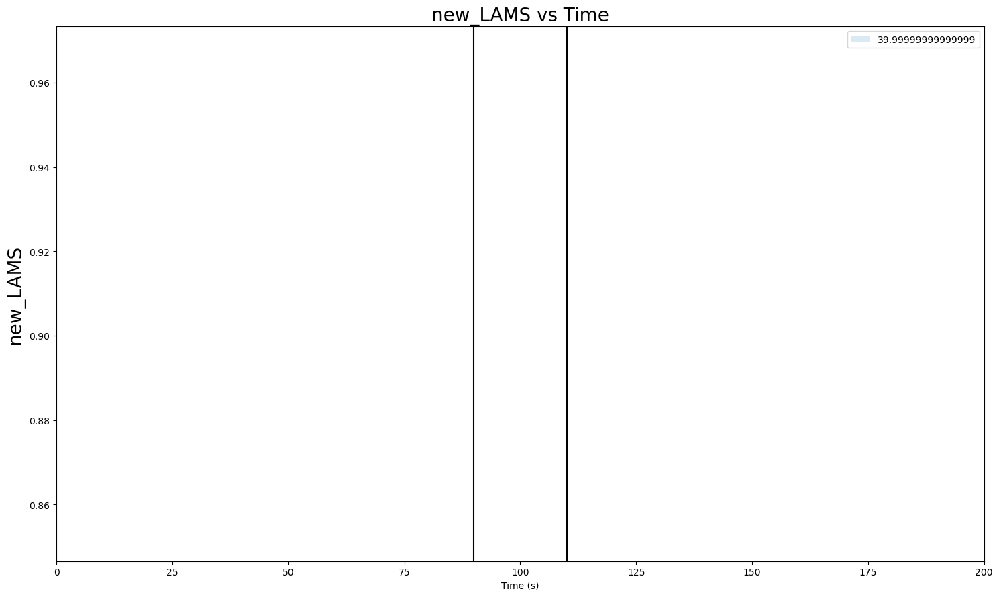

0.6333333333333333


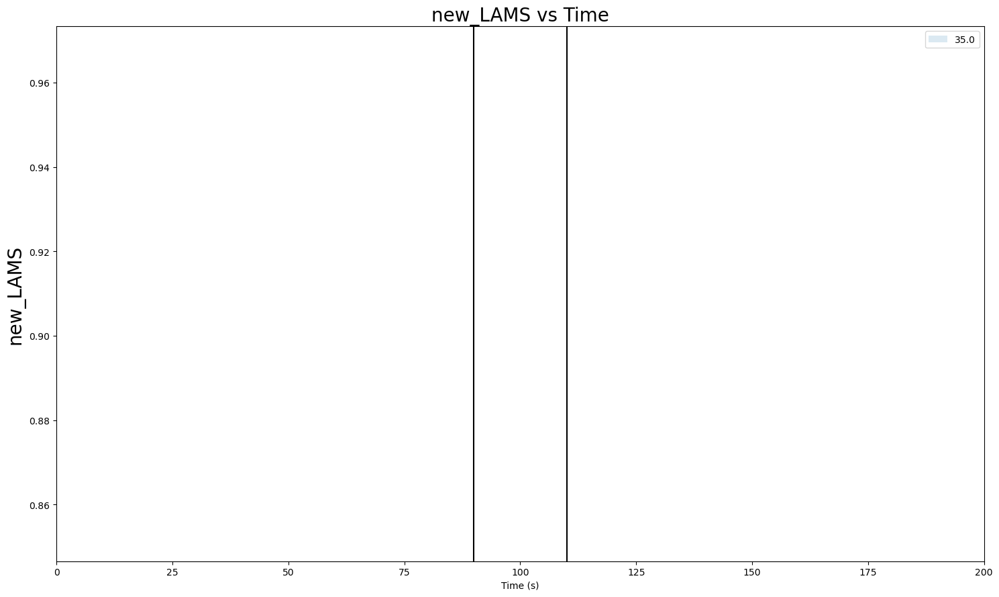

0.5966666666666667


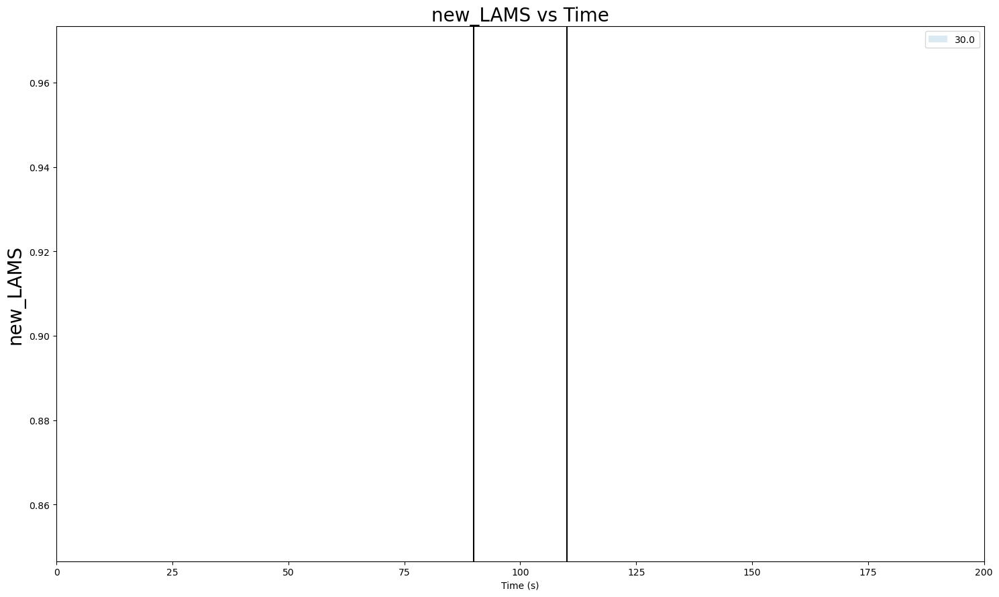

0.5566666666666666


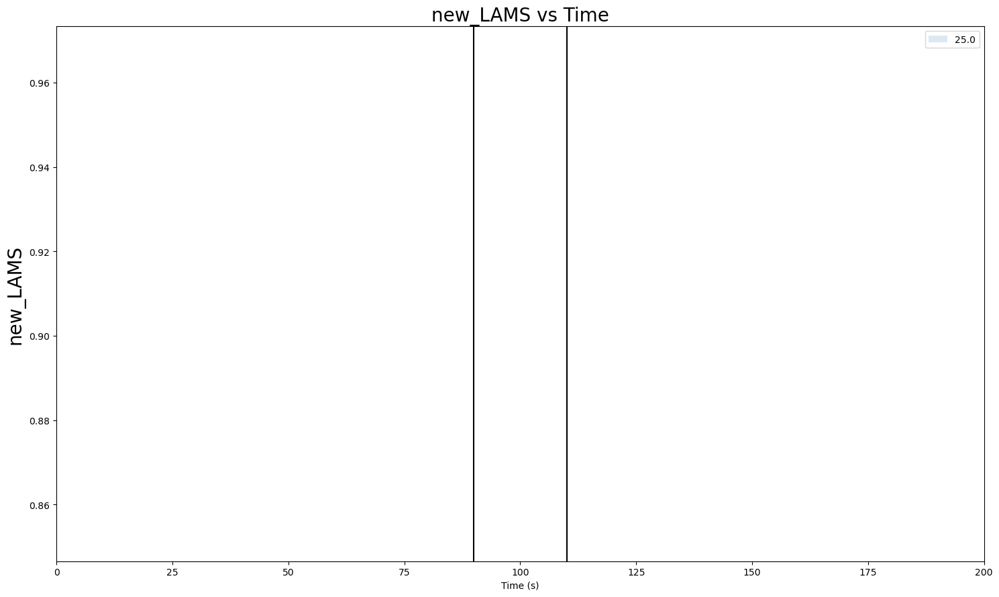

0.5466666666666666


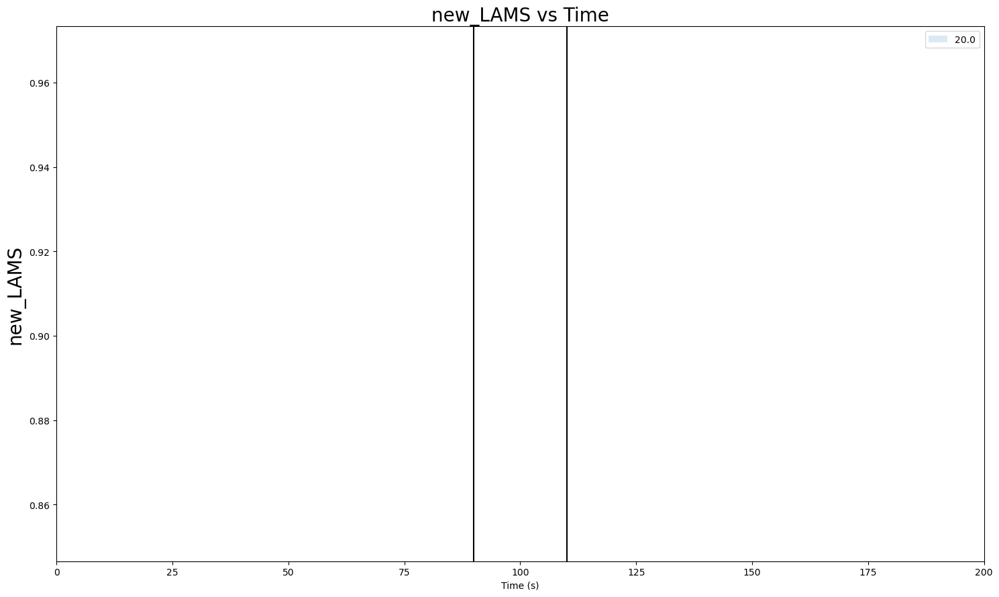

0.5333333333333333


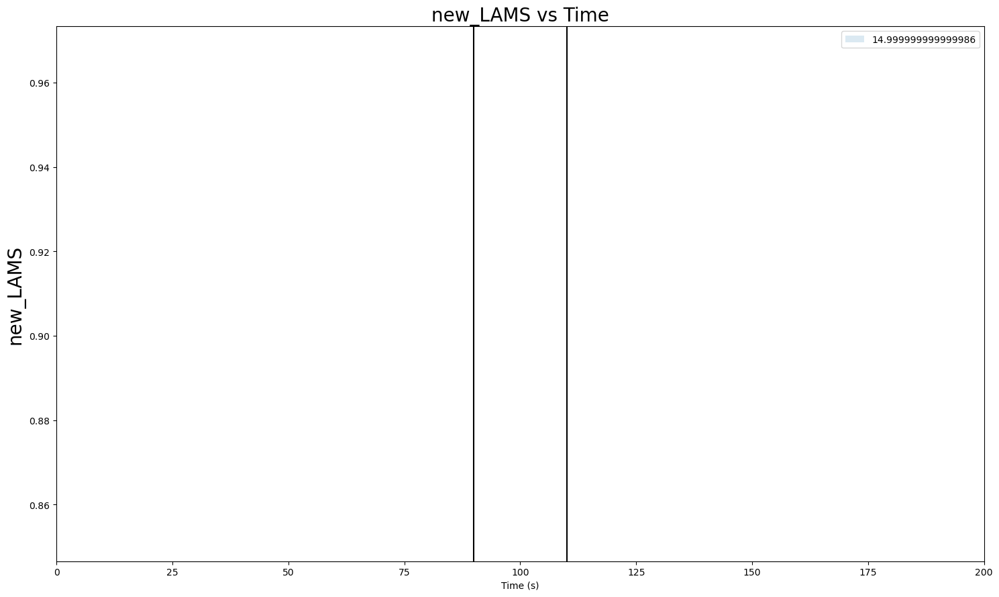

0.49


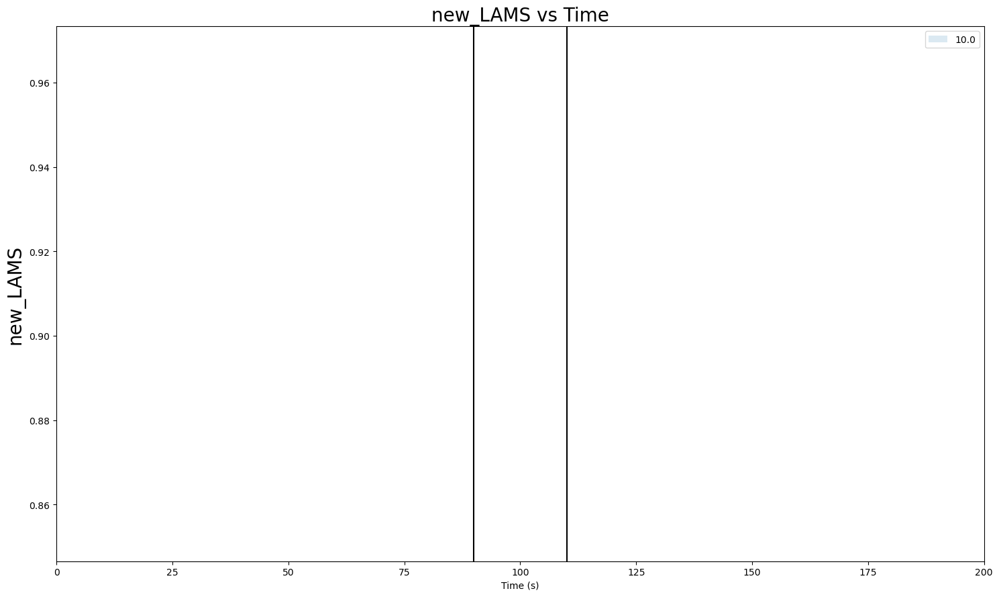

0.2966666666666667


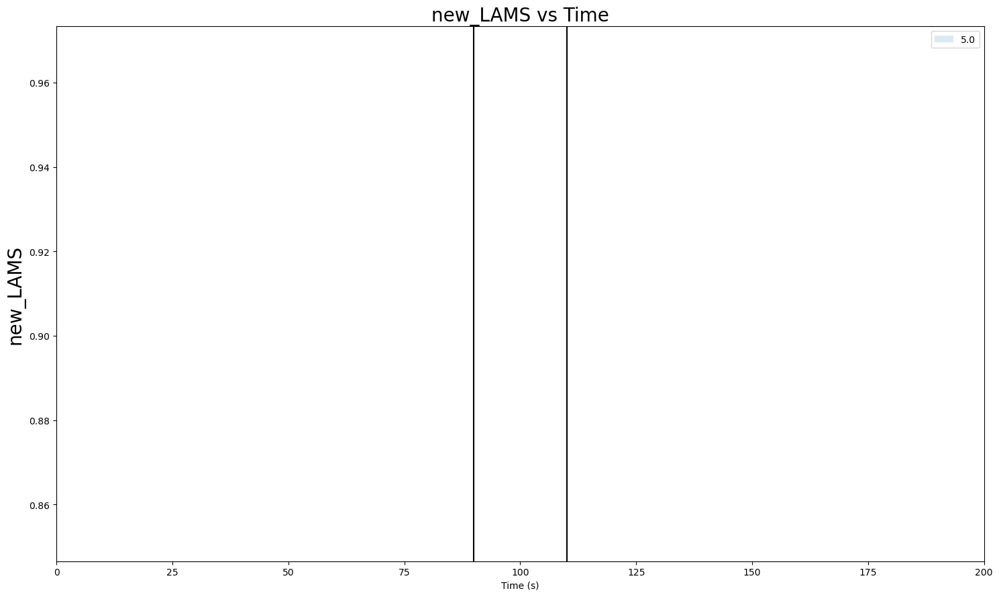

In [20]:
metric = new_LAMS
metric_name = 'new_LAMS'
alpha = 0.05
for i in range(1,20):
    plt.figure(figsize=(15,9))
    plt.plot(new_times,metric)
    plt.ylabel(f'{metric_name}', fontsize=20)
    plt.title(f'{metric_name} vs Time', fontsize =20)
    plt.xlabel('Time (s)')
    plt.xlim(0,total_time)
    plt.axvline(90, color='Black', linestyle='solid')
    plt.axvline(110,color='Black', linestyle='solid')
    alp = alpha * i 
    lo,hi = bootstrap_ci(sampled_lams,1,alpha=alp)
    condition = (metric >= lo) & (metric <= hi)

    count = np.sum(condition) / len(metric)
    print(count)
    plt.fill_between(new_times,lo,hi, alpha=0.16, label=f'{100-alp*100}')
    plt.tight_layout()
    plt.legend()
    plt.show()

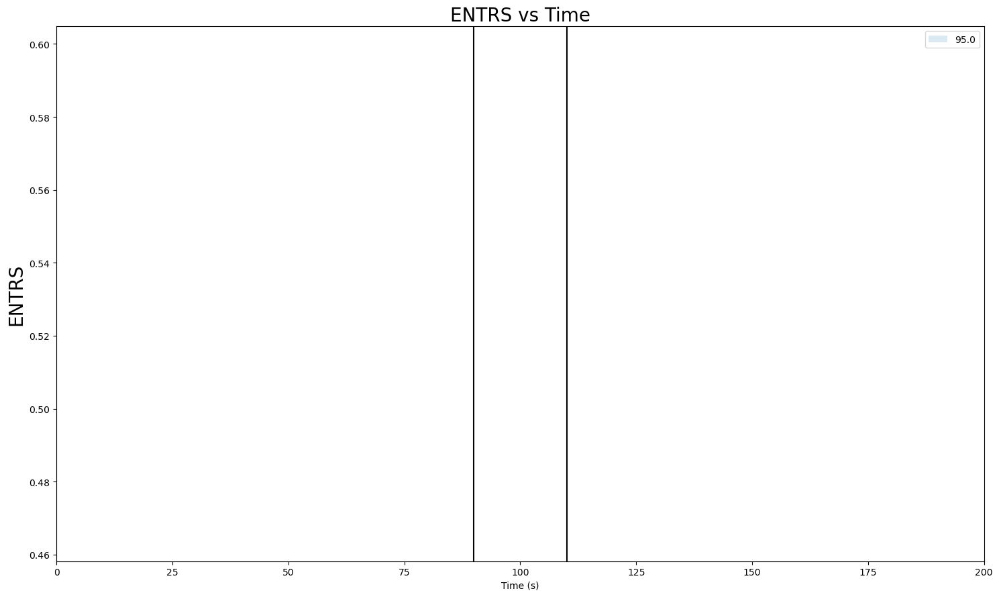

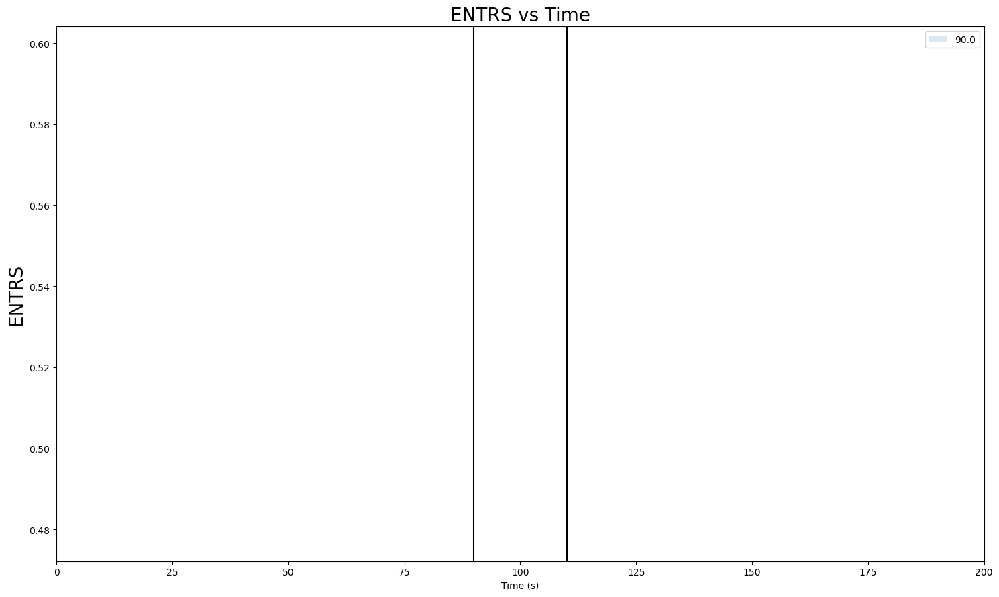

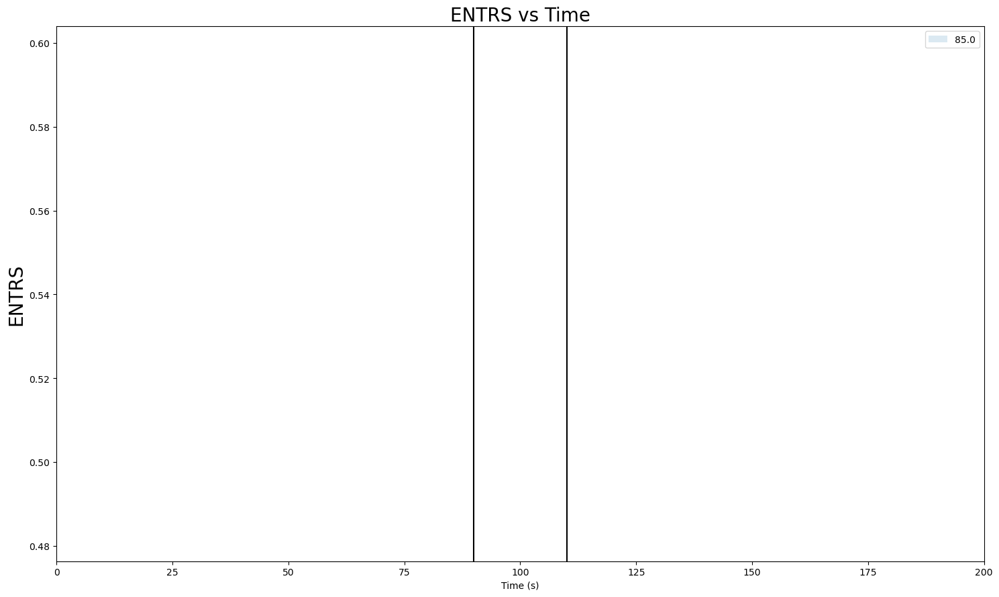

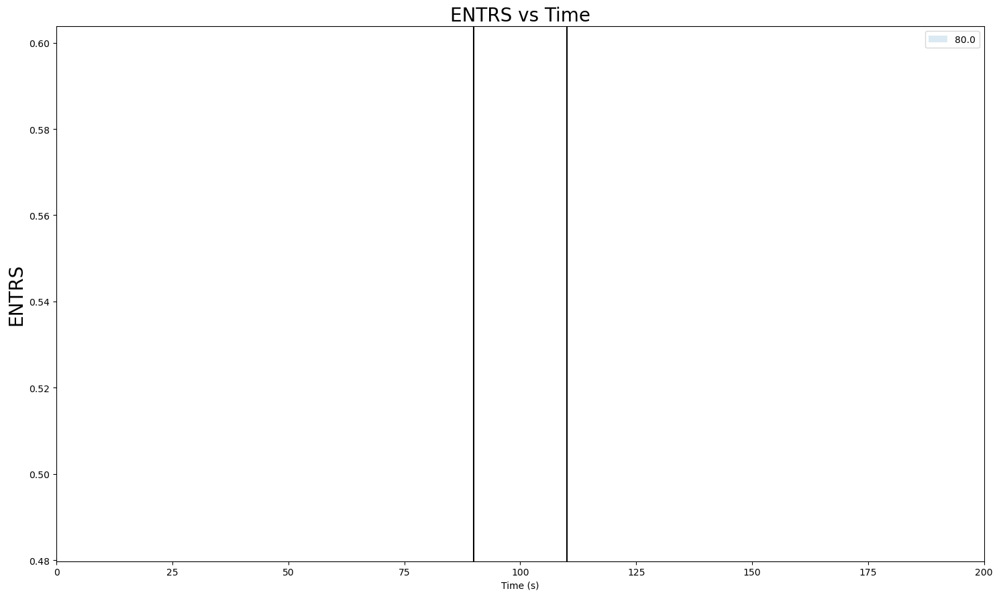

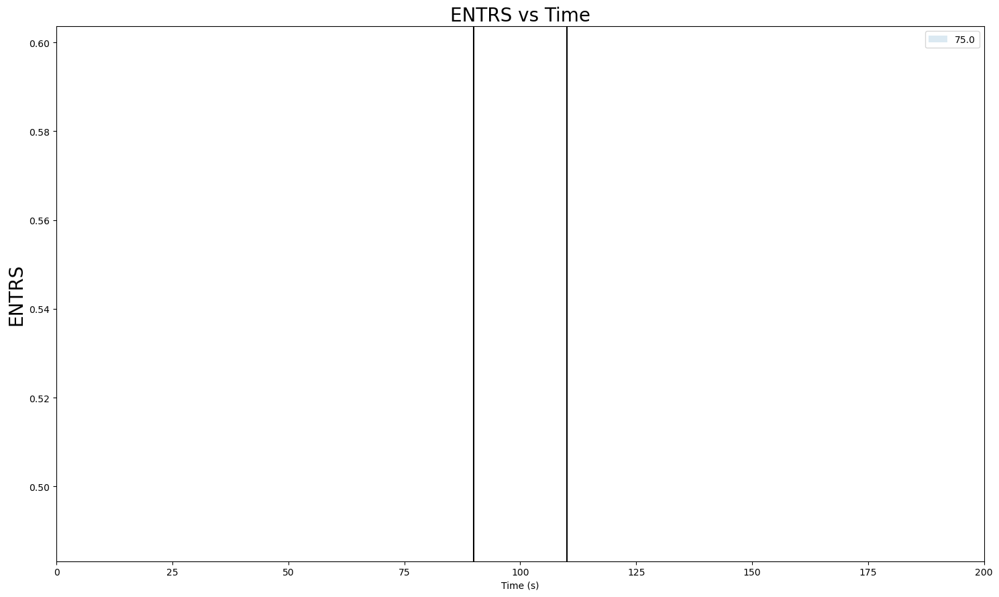

...

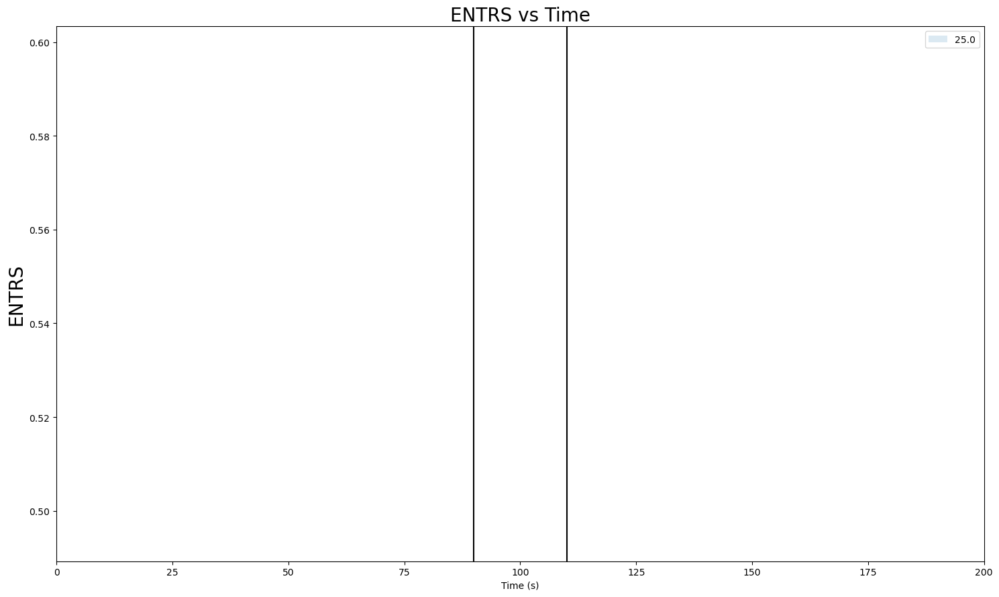

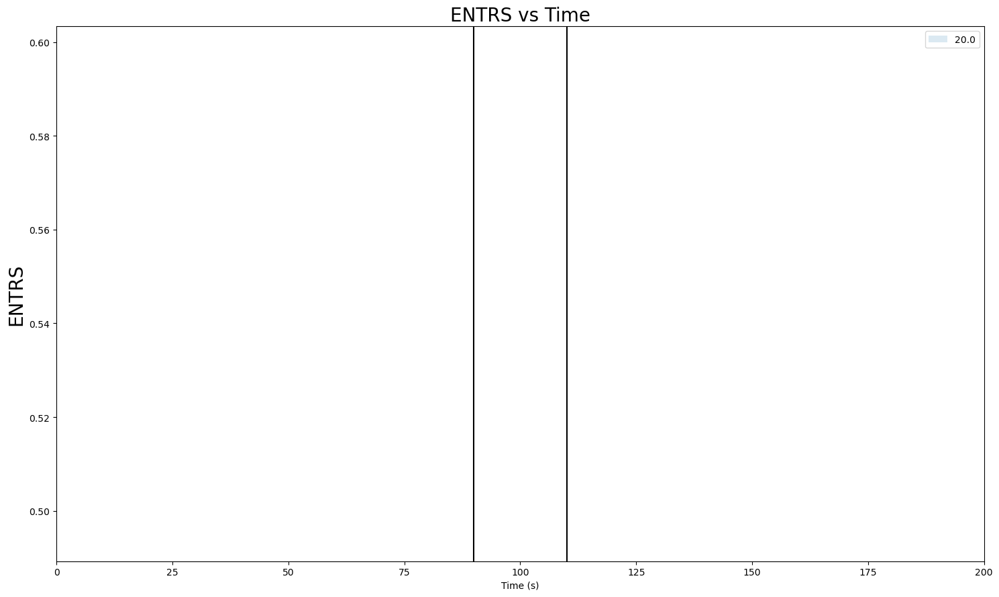

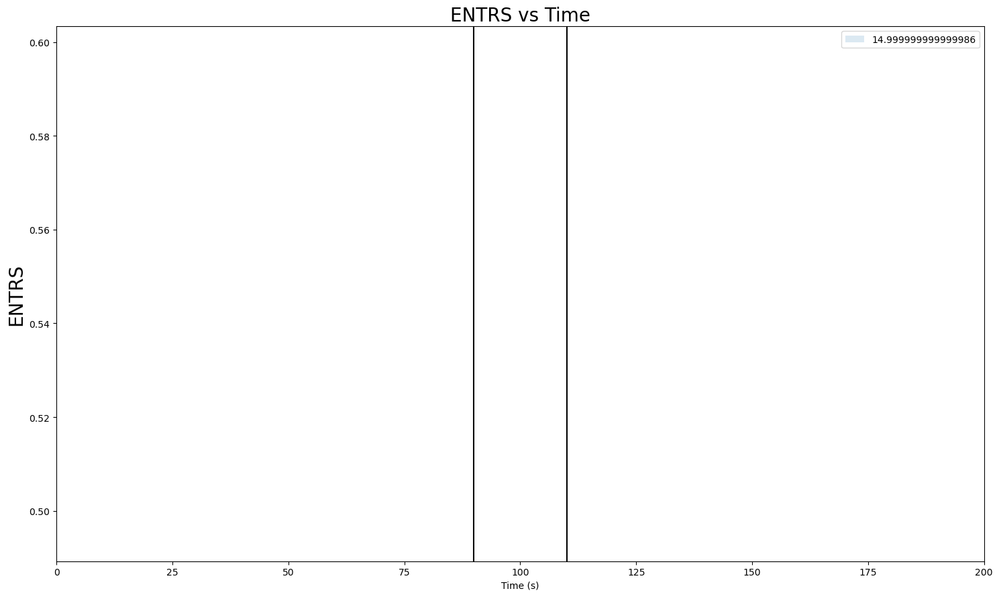

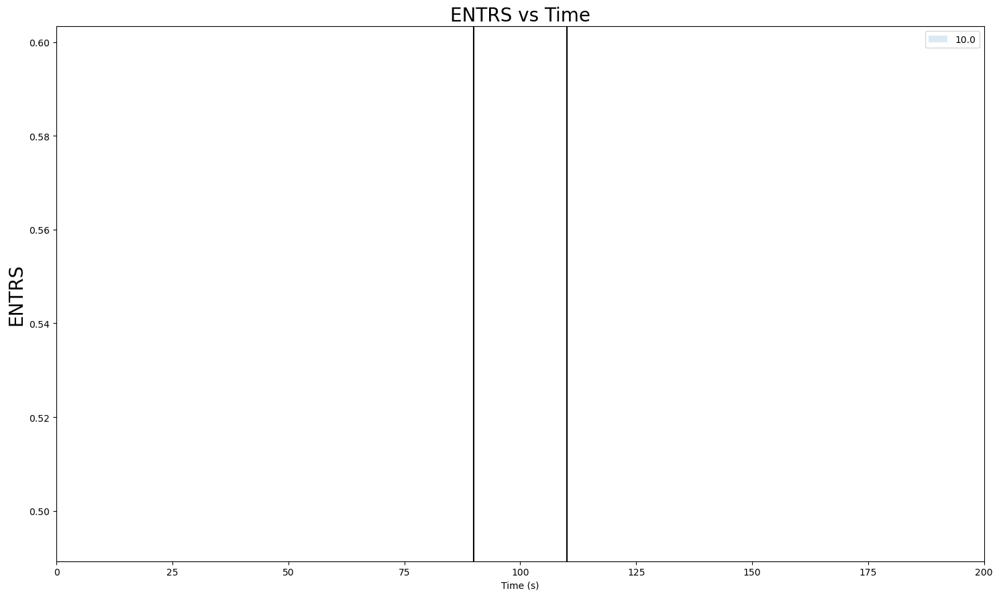

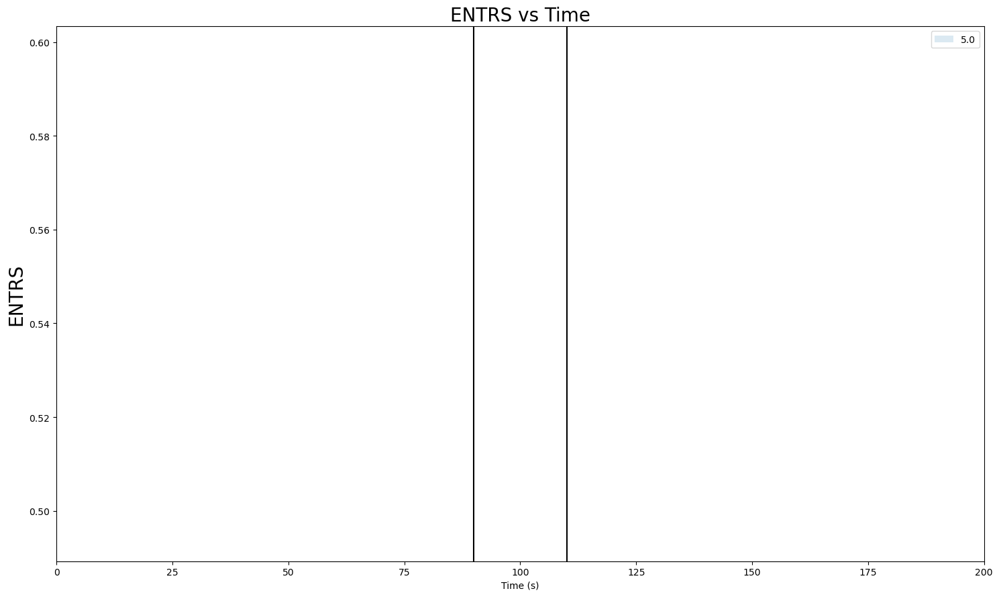

In [21]:
metric = new_ENTRS
metric_name = 'ENTRS'
alpha = 0.05
for i in range(1,20):
    plt.figure(figsize=(15,9))
    plt.plot(new_times,metric)
    plt.ylabel(f'{metric_name}', fontsize=20)
    plt.title(f'{metric_name} vs Time', fontsize =20)
    plt.xlabel('Time (s)')
    plt.xlim(0,total_time)
    plt.axvline(90, color='Black', linestyle='solid')
    plt.axvline(110,color='Black', linestyle='solid')
    alp = alpha * i 
    lo,hi = bootstrap_ci(sampled_entr,1,alpha=alp)
    plt.fill_between(new_times,lo,hi, alpha=0.16, label=f'{100-alp*100}')
    plt.tight_layout()
    plt.legend()
    plt.show()